In [1]:
# Load all imports and data
from algorithm.corellation_friends import CorrelationFriends
from algorithm.trend_follower import TrendFollower
from algorithm.example import SmaCross
from algorithm.revert_it import RevertIt
from algorithm.klam import Klam
from algorithm.arbi_check import ArbiCheck
from algorithm.uno_uno import UnoUno
from backtesting import Backtest
from backtesting.test import GOOG
import pandas as pd
import numpy as np
import backtesting
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression



btc_data = pd.read_csv('data/15m2024_02_04_to_2024_02_10/BTC.csv', parse_dates=True, infer_datetime_format=True)
btc_data['friend_0'] = pd.read_csv('data/15m2024_02_04_to_2024_02_10/XRP.csv')['Close']
btc_data['friend_1'] = pd.read_csv('data/15m2024_02_04_to_2024_02_10/ETH.csv')['Close']
btc_data['friend_2'] = pd.read_csv('data/15m2024_02_04_to_2024_02_10/ADA.csv')['Close']
btc_data['friend_3'] = pd.read_csv('data/15m2024_02_04_to_2024_02_10/SOL.csv')['Close']
print(btc_data.head())

for index, value in enumerate(btc_data['open_time']):
    try:
        pd.to_datetime(value, unit='ms')
    except ValueError:
        print(f"Value at index {index} is problematic: {value}")
btc_data['open_time'] = pd.to_datetime(btc_data['open_time'], unit='ms') 
btc_data.set_index('open_time', inplace=True)



btc_data = btc_data.iloc[:73920]
train_btc_data = btc_data.iloc[:30000]
test_btc_data = btc_data.iloc[30000:73920]

/opt/homebrew/lib/python3.11/site-packages/backtesting/test/__init__.py:8: FutureWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  return pd.read_csv(join(dirname(__file__), filename),
/opt/homebrew/lib/python3.11/site-packages/backtesting/test/__init__.py:8: FutureWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  return pd.read_csv(join(dirname(__file__), filename),
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_71424/284808324.py:19: FutureWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of

       open_time      Open      High       Low     Close    Volume  \
0  1639440000000  46679.93  46769.98  46397.07  46485.08  4505.619   
1  1639440900000  46486.88  46824.43  46255.60  46767.58  3590.136   
2  1639441800000  46766.84  47200.00  46763.23  47199.99  4725.737   
3  1639442700000  47200.00  47200.00  46970.00  46970.00  1900.725   
4  1639443600000  46970.01  47025.52  46868.28  46990.29  1939.341   

      Close_time  quote_volume  count  taker_buy_volume  \
0  1639440899999  2.097902e+08  52044          2148.751   
1  1639441799999  1.669772e+08  42215          1964.465   
2  1639442699999  2.222109e+08  52455          2592.173   
3  1639443599999  8.950348e+07  25058           743.054   
4  1639444499999  9.102711e+07  23692           897.447   

   taker_buy_quote_volume  ignore  friend_0  friend_1  friend_2  friend_3  
0            1.000594e+08       0    0.7790   3775.11    1.2171    154.01  
1            9.141009e+07       0    0.7873   3812.28    1.2285    155.3

# Import all the training algos
- later they will be used for finding optimal values



In [2]:
algos = dict(
    example = Backtest(GOOG, SmaCross, cash=10_000, commission=.002),
    correlation_friends_v_01 = Backtest(train_btc_data, CorrelationFriends, cash=1_000_000, commission=.002),
    trend_follower = Backtest(train_btc_data, TrendFollower,  cash=1_000_000, commission=.002),
    uno_uno = Backtest(train_btc_data, UnoUno, cash = 1_000_000, commission=.002),
    revert_it = Backtest(train_btc_data, RevertIt, cash = 1_000_000, commission=.002)
)

# Example Backtest
- example backtesting results on sample of GOOGLE data 

In [39]:
''' Example Backtest '''
# First one is just example on random GOOG daily data with SMA indicators ...
example_backtest = algos['example']
result_stats = example_backtest.run()
# Stats
print(result_stats)
# Plot
example_backtest.plot(resample=False, plot_volume=True, plot_drawdown=True, )

Start                     2004-08-19 00:00:00
End                       2013-03-01 00:00:00
Duration                   3116 days 00:00:00
Exposure Time [%]                   97.067039
Equity Final [$]                  68221.96986
Equity Peak [$]                   68991.21986
Return [%]                         582.219699
Buy & Hold Return [%]              703.458242
Return (Ann.) [%]                   25.266427
Volatility (Ann.) [%]               38.383008
Sharpe Ratio                         0.658271
Sortino Ratio                        1.288779
Calmar Ratio                         0.763748
Max. Drawdown [%]                  -33.082172
Avg. Drawdown [%]                   -5.581506
Max. Drawdown Duration      688 days 00:00:00
Avg. Drawdown Duration       41 days 00:00:00
# Trades                                   94
Win Rate [%]                        54.255319
Best Trade [%]                       57.11931
Worst Trade [%]                    -16.629898
Avg. Trade [%]                    

/opt/homebrew/lib/python3.11/site-packages/backtesting/_plotting.py:456: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  .resample(resample_rule, label='left')


Row(id='1498', ...)

# Correlation Friends v0.1 
- buil indicator based on highly correlated coins to the Bitcoin
- optimize the width or distance of the indicator from the current state of Btc, the stop_loss, take profit and the multiplicator of how much to go in to the action (long or short)
- optimization is done on training dataset, roughly speaking 10k - 30k tics, the evaluation is done on test data set which is 73k - #(train data set)
- (optimization es.t.) 20-30min


In [3]:
''' Correlation Friends v0.1 '''
correlation_friends = algos['correlation_friends_v_01']
safe_area_width_values = [x / 1000 for x in range(1, 25, 1)] 
profit_take =  [0.01, 0.02, 0.03, 0.04, 0.05]
loss_take = [0.01, 0.02, 0.03, 0.04, 0.05]
level_multi = [10, 9, 8, 7, 6, 5]
result_stats = correlation_friends.run()
# Finding optimal values on training part
# result = correlation_friends.optimize(
#     safe_area_width=safe_area_width_values,
#     profit_take=profit_take,
#     loss_take=loss_take,
#     level_multi=level_multi,
#     maximize='Equity Final [$]',
# )
# print('Optimal values found, proceed to next step!')
# print(result._strategy._params)
# print(result)


- now perform the strategy with optimalized values on test data set to see how it performs out of sample

In [4]:
test_data_backtest = Backtest(test_btc_data, CorrelationFriends, cash=1_000_000, commission=.002)
# Run the backtest on test data
stats = test_data_backtest.run()
print(stats)
# No resampling so genereated html is goind to be huge (in case of exploration of output, uncomment or visit directly 
# url: https://corr-friends-v01.netlify.app)
test_data_backtest.plot(resample=False, plot_volume=True, plot_drawdown=True)

Start                     2022-10-31 12:00:00
End                       2024-01-31 23:45:00
Duration                    457 days 11:45:00
Exposure Time [%]                   16.878415
Equity Final [$]                  1038325.804
Equity Peak [$]                  1054119.1126
Return [%]                            3.83258
Buy & Hold Return [%]              106.003359
Return (Ann.) [%]                    3.059664
Volatility (Ann.) [%]                2.763558
Sharpe Ratio                         1.107147
Sortino Ratio                        2.145371
Calmar Ratio                         1.734606
Max. Drawdown [%]                   -1.763895
Avg. Drawdown [%]                   -0.245984
Max. Drawdown Duration      104 days 01:45:00
Avg. Drawdown Duration        7 days 10:56:00
# Trades                                  202
Win Rate [%]                        53.465347
Best Trade [%]                       1.818196
Worst Trade [%]                     -2.215671
Avg. Trade [%]                    

/opt/homebrew/lib/python3.11/site-packages/backtesting/_plotting.py:456: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  .resample(resample_rule, label='left')


Row(id='1498', ...)

# Correlation Friends v0.2
- with optimalized length of time moving frame (forward testing approach)
- in first part 
    - perform all optimal values accross the whole training dataset with moving window and cache the optimal values
    - then  test those results on same dataset one step in front (on test data set) and cache the result of profit/loss %
    - choose which timeframe of reupload of Correlation Friend optimization is the best approach and declare it as the default one
    - perform its logic on test data to see how it performs

In [12]:
''' Correlation friends v0.2'''
# First perform all optimal values accross the whole training dataset with moving window
num_of_tics = [1000, 2000, 3000, 5000, 10000, 15000]
profit_take = [0.01, 0.02, 0.03, 0.04]
safe_area_width_values = [x / 1000 for x in range(1, 10, 1)]
loss_take = profit_take
level_multi = [10, 7, 5]
optim_result_cache = {
    1000: [],
    2000: [],
    3000: [],
    5000: [],
    10000: [],
    15000: []
}
for num in num_of_tics:
    num_of_movements = round(len(train_btc_data) / num)
    for index in range(num_of_movements):
        mini_btc = btc_data.iloc[index * num : (index + 1) * num]
        train_data_backtest = Backtest(mini_btc, CorrelationFriends, cash=1_000_000, commission=.002)
        optimal_strategy = train_data_backtest.optimize(
            safe_area_width=safe_area_width_values,
            profit_take=profit_take,
            loss_take=loss_take,
            level_multi=level_multi,
            maximize='Equity Final [$]',
        )
        str_representative = (optimal_strategy._strategy._params)
        optim_result_cache[num].append({'from': index * num, 'to': (index + 1) * num, 'optimal_strategy': str_representative})
        # optim_result_cache = {'1000': [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.01, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 8000, 'to': 9000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.04, 'level_multi': 10}}, {'from': 9000, 'to': 10000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 10}}, {'from': 10000, 'to': 11000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.03, 'loss_take': 0.02, 'level_multi': 10}}, {'from': 11000, 'to': 12000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.02, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 12000, 'to': 13000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.02, 'loss_take': 0.02, 'level_multi': 10}}, {'from': 13000, 'to': 14000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 14000, 'to': 15000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 15000, 'to': 16000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.02, 'loss_take': 0.02, 'level_multi': 10}}, {'from': 16000, 'to': 17000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 10}}, {'from': 17000, 'to': 18000, 'optimal_strategy': {'safe_area_width': 0.006, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 18000, 'to': 19000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.04, 'level_multi': 10}}, {'from': 19000, 'to': 20000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 10}}, {'from': 20000, 'to': 21000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 21000, 'to': 22000, 'optimal_strategy': {'safe_area_width': 0.008, 'profit_take': 0.01, 'loss_take': 0.01, 'level_multi': 5}}, {'from': 22000, 'to': 23000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 23000, 'to': 24000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.04, 'loss_take': 0.04, 'level_multi': 10}}, {'from': 24000, 'to': 25000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.01, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 25000, 'to': 26000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 10}}, {'from': 26000, 'to': 27000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.02, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 27000, 'to': 28000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.02, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 28000, 'to': 29000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 10}}, {'from': 29000, 'to': 30000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 10}}], '2000': [{'from': 0, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 2000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.007, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.005, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 6000, 'to': 8000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.01, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 8000, 'to': 10000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.04, 'level_multi': 10}}, {'from': 10000, 'to': 12000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.03, 'loss_take': 0.02, 'level_multi': 10}}, {'from': 12000, 'to': 14000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 14000, 'to': 16000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.02, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 16000, 'to': 18000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 18000, 'to': 20000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.04, 'level_multi': 10}}, {'from': 20000, 'to': 22000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 5}}, {'from': 22000, 'to': 24000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.04, 'loss_take': 0.04, 'level_multi': 10}}, {'from': 24000, 'to': 26000, 'optimal_strategy': {'safe_area_width': 0.006, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 10}}, {'from': 26000, 'to': 28000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.02, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 28000, 'to': 30000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}], '3000': [{'from': 0, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 3000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 9000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.01, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 9000, 'to': 12000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 10}}, {'from': 12000, 'to': 15000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 15000, 'to': 18000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 18000, 'to': 21000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.04, 'level_multi': 10}}, {'from': 21000, 'to': 24000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 24000, 'to': 27000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.04, 'level_multi': 10}}, {'from': 27000, 'to': 30000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}], '5000': [{'from': 0, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 10000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 10000, 'to': 15000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 15000, 'to': 20000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 20000, 'to': 25000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 25000, 'to': 30000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.04, 'loss_take': 0.04, 'level_multi': 7}}], '10000': [{'from': 0, 'to': 10000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.01, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 10000, 'to': 20000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 20000, 'to': 30000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 10}}], '15000': [{'from': 0, 'to': 15000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 5}}, {'from': 15000, 'to': 30000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}]}
        print(optim_result_cache)


/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}], 2000: [], 3000: [], 5000: [], 10000: [], 15000: []}


/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}], 2000: [], 3000: [], 5000: [], 10000: [], 15000: []}
{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}], 2000: [], 3000: [], 5000: [], 10000: [], 15000: []}


/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}], 2000: [], 3000: [], 5000: [], 10000: [], 15000: []}


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}], 2000: [], 3000: [], 5000: [], 10000: [], 15000: []}


/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}], 2000: [], 3000: [], 5000: [], 10000: [], 15000: []}


/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}], 2000: [], 3000: [], 5000: [], 10000: [], 15000: []}


/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_st

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_st

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_st

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_st

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_st

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_st

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501
/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(ann

{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 432 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


{1000: [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_a

In [6]:
optim_result_cache = {'1000': [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.01, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 8000, 'to': 9000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.04, 'level_multi': 10}}, {'from': 9000, 'to': 10000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 10}}, {'from': 10000, 'to': 11000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.03, 'loss_take': 0.02, 'level_multi': 10}}, {'from': 11000, 'to': 12000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.02, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 12000, 'to': 13000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.02, 'loss_take': 0.02, 'level_multi': 10}}, {'from': 13000, 'to': 14000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 14000, 'to': 15000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 15000, 'to': 16000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.02, 'loss_take': 0.02, 'level_multi': 10}}, {'from': 16000, 'to': 17000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 10}}, {'from': 17000, 'to': 18000, 'optimal_strategy': {'safe_area_width': 0.006, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 18000, 'to': 19000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.04, 'level_multi': 10}}, {'from': 19000, 'to': 20000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 10}}, {'from': 20000, 'to': 21000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 21000, 'to': 22000, 'optimal_strategy': {'safe_area_width': 0.008, 'profit_take': 0.01, 'loss_take': 0.01, 'level_multi': 5}}, {'from': 22000, 'to': 23000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 23000, 'to': 24000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.04, 'loss_take': 0.04, 'level_multi': 10}}, {'from': 24000, 'to': 25000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.01, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 25000, 'to': 26000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 10}}, {'from': 26000, 'to': 27000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.02, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 27000, 'to': 28000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.02, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 28000, 'to': 29000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 10}}, {'from': 29000, 'to': 30000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 10}}], '2000': [{'from': 0, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 2000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.007, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.005, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 6000, 'to': 8000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.01, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 8000, 'to': 10000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.04, 'level_multi': 10}}, {'from': 10000, 'to': 12000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.03, 'loss_take': 0.02, 'level_multi': 10}}, {'from': 12000, 'to': 14000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 14000, 'to': 16000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.02, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 16000, 'to': 18000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 18000, 'to': 20000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.04, 'level_multi': 10}}, {'from': 20000, 'to': 22000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 5}}, {'from': 22000, 'to': 24000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.04, 'loss_take': 0.04, 'level_multi': 10}}, {'from': 24000, 'to': 26000, 'optimal_strategy': {'safe_area_width': 0.006, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 10}}, {'from': 26000, 'to': 28000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.02, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 28000, 'to': 30000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}], '3000': [{'from': 0, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 3000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 9000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.01, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 9000, 'to': 12000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 10}}, {'from': 12000, 'to': 15000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 15000, 'to': 18000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 18000, 'to': 21000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.04, 'level_multi': 10}}, {'from': 21000, 'to': 24000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 24000, 'to': 27000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.04, 'level_multi': 10}}, {'from': 27000, 'to': 30000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}], '5000': [{'from': 0, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 10000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 10000, 'to': 15000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 15000, 'to': 20000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 20000, 'to': 25000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 25000, 'to': 30000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.04, 'loss_take': 0.04, 'level_multi': 7}}], '10000': [{'from': 0, 'to': 10000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.01, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 10000, 'to': 20000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 20000, 'to': 30000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 10}}], '15000': [{'from': 0, 'to': 15000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 5}}, {'from': 15000, 'to': 30000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}]}
print(optim_result_cache)

{'1000': [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe

In [10]:
# for the cache purposes only ...
import json
optim_result_cache = json.loads('''{
  "1000": [
    {
      "from": 0,
      "to": 1000,
      "optimal_strategy": {
        "safe_area_width": 0.002,
        "profit_take": 0.03,
        "loss_take": 0.03,
        "level_multi": 10
      }
    },
    {
      "from": 1000,
      "to": 2000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.04,
        "loss_take": 0.01,
        "level_multi": 7
      }
    },
    {
      "from": 2000,
      "to": 3000,
      "optimal_strategy": {
        "safe_area_width": 0.009,
        "profit_take": 0.04,
        "loss_take": 0.02,
        "level_multi": 5
      }
    },
    {
      "from": 3000,
      "to": 4000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.03,
        "loss_take": 0.04,
        "level_multi": 7
      }
    },
    {
      "from": 4000,
      "to": 5000,
      "optimal_strategy": {
        "safe_area_width": 0.004,
        "profit_take": 0.04,
        "loss_take": 0.03,
        "level_multi": 7
      }
    },
    {
      "from": 5000,
      "to": 6000,
      "optimal_strategy": {
        "safe_area_width": 0.003,
        "profit_take": 0.04,
        "loss_take": 0.03,
        "level_multi": 7
      }
    },
    {
      "from": 6000,
      "to": 7000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.03,
        "loss_take": 0.01,
        "level_multi": 10
      }
    },
    {
      "from": 7000,
      "to": 8000,
      "optimal_strategy": {
        "safe_area_width": 0.002,
        "profit_take": 0.01,
        "loss_take": 0.03,
        "level_multi": 10
      }
    },
    {
      "from": 8000,
      "to": 9000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.04,
        "loss_take": 0.04,
        "level_multi": 10
      }
    },
    {
      "from": 9000,
      "to": 10000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.04,
        "loss_take": 0.02,
        "level_multi": 10
      }
    },
    {
      "from": 10000,
      "to": 11000,
      "optimal_strategy": {
        "safe_area_width": 0.003,
        "profit_take": 0.03,
        "loss_take": 0.02,
        "level_multi": 10
      }
    },
    {
      "from": 11000,
      "to": 12000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.02,
        "loss_take": 0.01,
        "level_multi": 10
      }
    },
    {
      "from": 12000,
      "to": 13000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.02,
        "loss_take": 0.02,
        "level_multi": 10
      }
    },
    {
      "from": 13000,
      "to": 14000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.04,
        "loss_take": 0.03,
        "level_multi": 10
      }
    },
    {
      "from": 14000,
      "to": 15000,
      "optimal_strategy": {
        "safe_area_width": 0.004,
        "profit_take": 0.03,
        "loss_take": 0.03,
        "level_multi": 10
      }
    },
    {
      "from": 15000,
      "to": 16000,
      "optimal_strategy": {
        "safe_area_width": 0.009,
        "profit_take": 0.02,
        "loss_take": 0.02,
        "level_multi": 10
      }
    },
    {
      "from": 16000,
      "to": 17000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.04,
        "loss_take": 0.02,
        "level_multi": 10
      }
    },
    {
      "from": 17000,
      "to": 18000,
      "optimal_strategy": {
        "safe_area_width": 0.006,
        "profit_take": 0.03,
        "loss_take": 0.03,
        "level_multi": 10
      }
    },
    {
      "from": 18000,
      "to": 19000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.04,
        "loss_take": 0.04,
        "level_multi": 10
      }
    },
    {
      "from": 19000,
      "to": 20000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.03,
        "loss_take": 0.04,
        "level_multi": 10
      }
    },
    {
      "from": 20000,
      "to": 21000,
      "optimal_strategy": {
        "safe_area_width": 0.003,
        "profit_take": 0.04,
        "loss_take": 0.03,
        "level_multi": 10
      }
    },
    {
      "from": 21000,
      "to": 22000,
      "optimal_strategy": {
        "safe_area_width": 0.008,
        "profit_take": 0.01,
        "loss_take": 0.01,
        "level_multi": 5
      }
    },
    {
      "from": 22000,
      "to": 23000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.03,
        "loss_take": 0.03,
        "level_multi": 10
      }
    },
    {
      "from": 23000,
      "to": 24000,
      "optimal_strategy": {
        "safe_area_width": 0.002,
        "profit_take": 0.04,
        "loss_take": 0.04,
        "level_multi": 10
      }
    },
    {
      "from": 24000,
      "to": 25000,
      "optimal_strategy": {
        "safe_area_width": 0.002,
        "profit_take": 0.01,
        "loss_take": 0.02,
        "level_multi": 5
      }
    },
    {
      "from": 25000,
      "to": 26000,
      "optimal_strategy": {
        "safe_area_width": 0.004,
        "profit_take": 0.03,
        "loss_take": 0.04,
        "level_multi": 10
      }
    },
    {
      "from": 26000,
      "to": 27000,
      "optimal_strategy": {
        "safe_area_width": 0.002,
        "profit_take": 0.02,
        "loss_take": 0.03,
        "level_multi": 10
      }
    },
    {
      "from": 27000,
      "to": 28000,
      "optimal_strategy": {
        "safe_area_width": 0.002,
        "profit_take": 0.02,
        "loss_take": 0.01,
        "level_multi": 10
      }
    },
    {
      "from": 28000,
      "to": 29000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.04,
        "loss_take": 0.02,
        "level_multi": 10
      }
    },
    {
      "from": 29000,
      "to": 30000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.04,
        "loss_take": 0.03,
        "level_multi": 10
      }
    }
  ],
  "2000": [
    {
      "from": 0,
      "to": 2000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.04,
        "loss_take": 0.03,
        "level_multi": 7
      }
    },
    {
      "from": 2000,
      "to": 4000,
      "optimal_strategy": {
        "safe_area_width": 0.007,
        "profit_take": 0.03,
        "loss_take": 0.04,
        "level_multi": 7
      }
    },
    {
      "from": 4000,
      "to": 6000,
      "optimal_strategy": {
        "safe_area_width": 0.005,
        "profit_take": 0.04,
        "loss_take": 0.03,
        "level_multi": 10
      }
    },
    {
      "from": 6000,
      "to": 8000,
      "optimal_strategy": {
        "safe_area_width": 0.002,
        "profit_take": 0.01,
        "loss_take": 0.03,
        "level_multi": 10
      }
    },
    {
      "from": 8000,
      "to": 10000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.04,
        "loss_take": 0.04,
        "level_multi": 10
      }
    },
    {
      "from": 10000,
      "to": 12000,
      "optimal_strategy": {
        "safe_area_width": 0.003,
        "profit_take": 0.03,
        "loss_take": 0.02,
        "level_multi": 10
      }
    },
    {
      "from": 12000,
      "to": 14000,
      "optimal_strategy": {
        "safe_area_width": 0.002,
        "profit_take": 0.04,
        "loss_take": 0.03,
        "level_multi": 10
      }
    },
    {
      "from": 14000,
      "to": 16000,
      "optimal_strategy": {
        "safe_area_width": 0.009,
        "profit_take": 0.02,
        "loss_take": 0.03,
        "level_multi": 10
      }
    },
    {
      "from": 16000,
      "to": 18000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.03,
        "loss_take": 0.03,
        "level_multi": 10
      }
    },
    {
      "from": 18000,
      "to": 20000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.04,
        "loss_take": 0.04,
        "level_multi": 10
      }
    },
    {
      "from": 20000,
      "to": 22000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.04,
        "loss_take": 0.03,
        "level_multi": 5
      }
    },
    {
      "from": 22000,
      "to": 24000,
      "optimal_strategy": {
        "safe_area_width": 0.002,
        "profit_take": 0.04,
        "loss_take": 0.04,
        "level_multi": 10
      }
    },
    {
      "from": 24000,
      "to": 26000,
      "optimal_strategy": {
        "safe_area_width": 0.006,
        "profit_take": 0.04,
        "loss_take": 0.02,
        "level_multi": 10
      }
    },
    {
      "from": 26000,
      "to": 28000,
      "optimal_strategy": {
        "safe_area_width": 0.002,
        "profit_take": 0.02,
        "loss_take": 0.03,
        "level_multi": 10
      }
    },
    {
      "from": 28000,
      "to": 30000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.04,
        "loss_take": 0.03,
        "level_multi": 7
      }
    }
  ],
  "3000": [
    {
      "from": 0,
      "to": 3000,
      "optimal_strategy": {
        "safe_area_width": 0.003,
        "profit_take": 0.03,
        "loss_take": 0.03,
        "level_multi": 10
      }
    },
    {
      "from": 3000,
      "to": 6000,
      "optimal_strategy": {
        "safe_area_width": 0.003,
        "profit_take": 0.04,
        "loss_take": 0.03,
        "level_multi": 7
      }
    },
    {
      "from": 6000,
      "to": 9000,
      "optimal_strategy": {
        "safe_area_width": 0.002,
        "profit_take": 0.01,
        "loss_take": 0.03,
        "level_multi": 10
      }
    },
    {
      "from": 9000,
      "to": 12000,
      "optimal_strategy": {
        "safe_area_width": 0.004,
        "profit_take": 0.03,
        "loss_take": 0.04,
        "level_multi": 10
      }
    },
    {
      "from": 12000,
      "to": 15000,
      "optimal_strategy": {
        "safe_area_width": 0.002,
        "profit_take": 0.04,
        "loss_take": 0.03,
        "level_multi": 10
      }
    },
    {
      "from": 15000,
      "to": 18000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.03,
        "loss_take": 0.03,
        "level_multi": 10
      }
    },
    {
      "from": 18000,
      "to": 21000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.04,
        "loss_take": 0.04,
        "level_multi": 10
      }
    },
    {
      "from": 21000,
      "to": 24000,
      "optimal_strategy": {
        "safe_area_width": 0.004,
        "profit_take": 0.04,
        "loss_take": 0.01,
        "level_multi": 10
      }
    },
    {
      "from": 24000,
      "to": 27000,
      "optimal_strategy": {
        "safe_area_width": 0.004,
        "profit_take": 0.04,
        "loss_take": 0.04,
        "level_multi": 10
      }
    },
    {
      "from": 27000,
      "to": 30000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.04,
        "loss_take": 0.01,
        "level_multi": 7
      }
    }
  ],
  "5000": [
    {
      "from": 0,
      "to": 5000,
      "optimal_strategy": {
        "safe_area_width": 0.003,
        "profit_take": 0.04,
        "loss_take": 0.03,
        "level_multi": 7
      }
    },
    {
      "from": 5000,
      "to": 10000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.04,
        "loss_take": 0.01,
        "level_multi": 10
      }
    },
    {
      "from": 10000,
      "to": 15000,
      "optimal_strategy": {
        "safe_area_width": 0.002,
        "profit_take": 0.04,
        "loss_take": 0.03,
        "level_multi": 10
      }
    },
    {
      "from": 15000,
      "to": 20000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.03,
        "loss_take": 0.03,
        "level_multi": 10
      }
    },
    {
      "from": 20000,
      "to": 25000,
      "optimal_strategy": {
        "safe_area_width": 0.004,
        "profit_take": 0.04,
        "loss_take": 0.01,
        "level_multi": 10
      }
    },
    {
      "from": 25000,
      "to": 30000,
      "optimal_strategy": {
        "safe_area_width": 0.002,
        "profit_take": 0.04,
        "loss_take": 0.04,
        "level_multi": 7
      }
    }
  ],
  "10000": [
    {
      "from": 0,
      "to": 10000,
      "optimal_strategy": {
        "safe_area_width": 0.003,
        "profit_take": 0.01,
        "loss_take": 0.03,
        "level_multi": 7
      }
    },
    {
      "from": 10000,
      "to": 20000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.03,
        "loss_take": 0.03,
        "level_multi": 10
      }
    },
    {
      "from": 20000,
      "to": 30000,
      "optimal_strategy": {
        "safe_area_width": 0.004,
        "profit_take": 0.04,
        "loss_take": 0.02,
        "level_multi": 10
      }
    }
  ],
  "15000": [
    {
      "from": 0,
      "to": 15000,
      "optimal_strategy": {
        "safe_area_width": 0.001,
        "profit_take": 0.04,
        "loss_take": 0.03,
        "level_multi": 5
      }
    },
    {
      "from": 15000,
      "to": 30000,
      "optimal_strategy": {
        "safe_area_width": 0.002,
        "profit_take": 0.04,
        "loss_take": 0.03,
        "level_multi": 7
      }
    }
  ]
}''')
print(optim_result_cache)

{'1000': [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe

In [11]:
print(optim_result_cache)
optim_result_cache = dict(optim_result_cache)
results = []
for key, value in optim_result_cache.items():
    key = int(key)
    temp_result = []

    for item in value:
        from_val = item['from'] + key
        to_val = item['to'] + key
        optimal_vals = dict(item['optimal_strategy'])
        if to_val > len(train_btc_data):
            break
        mini_btc_data = train_btc_data[from_val:to_val]
        mini_btc_data['safe_area_width'] = optimal_vals['safe_area_width']
        mini_btc_data['profit_take'] = optimal_vals['profit_take']
        mini_btc_data['loss_take'] = optimal_vals['loss_take']
        mini_btc_data['level_multi'] = optimal_vals['level_multi']
        print(f"From: {from_val}, To: {to_val}")
        forward_test = Backtest(mini_btc_data, CorrelationFriends, cash=1_000_000, commission=.002)
        stats = forward_test.run()
        temp_result.append(stats._equity_curve['Equity'][-1])
    results.append(temp_result)
        




{'1000': [{'from': 0, 'to': 1000, 'optimal_strategy': {'safe_area_width': 0.002, 'profit_take': 0.03, 'loss_take': 0.03, 'level_multi': 10}}, {'from': 1000, 'to': 2000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.01, 'level_multi': 7}}, {'from': 2000, 'to': 3000, 'optimal_strategy': {'safe_area_width': 0.009, 'profit_take': 0.04, 'loss_take': 0.02, 'level_multi': 5}}, {'from': 3000, 'to': 4000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.04, 'level_multi': 7}}, {'from': 4000, 'to': 5000, 'optimal_strategy': {'safe_area_width': 0.004, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 5000, 'to': 6000, 'optimal_strategy': {'safe_area_width': 0.003, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 7}}, {'from': 6000, 'to': 7000, 'optimal_strategy': {'safe_area_width': 0.001, 'profit_take': 0.03, 'loss_take': 0.01, 'level_multi': 10}}, {'from': 7000, 'to': 8000, 'optimal_strategy': {'safe

/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mini_btc_data['safe_area_width'] = optimal_vals['safe_area_width']
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mini_btc_data['profit_take'] = optimal_vals['profit_take']
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:17: SettingWithCopyWarning: 
A value is trying to

From: 3000, To: 4000
initiate_variables
Using safe area width: 0.009 with take_profit: 0.04 and stop_lost: 0.02
From: 4000, To: 5000
initiate_variables
Using safe area width: 0.001 with take_profit: 0.03 and stop_lost: 0.04
From: 5000, To: 6000
initiate_variables
Using safe area width: 0.004 with take_profit: 0.04 and stop_lost: 0.03
From: 6000, To: 7000
initiate_variables
Using safe area width: 0.003 with take_profit: 0.04 and stop_lost: 0.03
From: 7000, To: 8000
initiate_variables
Using safe area width: 0.001 with take_profit: 0.03 and stop_lost: 0.01
From: 8000, To: 9000
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.03
From: 9000, To: 10000
initiate_variables
Using safe area width: 0.001 with take_profit: 0.04 and stop_lost: 0.04
From: 10000, To: 11000
initiate_variables
Using safe area width: 0.001 with take_profit: 0.04 and stop_lost: 0.02


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:22: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  temp_result.append(stats._equity_curve['Equity'][-1])
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mini_btc_data['safe_area_width'] = optimal_vals['safe_area_width']
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc

From: 11000, To: 12000
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.02
From: 12000, To: 13000
initiate_variables
Using safe area width: 0.001 with take_profit: 0.02 and stop_lost: 0.01
From: 13000, To: 14000
initiate_variables
Using safe area width: 0.001 with take_profit: 0.02 and stop_lost: 0.02
From: 14000, To: 15000
initiate_variables
Using safe area width: 0.001 with take_profit: 0.04 and stop_lost: 0.03
From: 15000, To: 16000
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.03
From: 16000, To: 17000
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.02
From: 17000, To: 18000
initiate_variables
Using safe area width: 0.001 with take_profit: 0.04 and stop_lost: 0.02
From: 18000, To: 19000
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.03
From: 19000, To: 20000
initiate_variables
Using safe area width: 0.001 with take_profit:

/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:22: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  temp_result.append(stats._equity_curve['Equity'][-1])
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mini_btc_data['safe_area_width'] = optimal_vals['safe_area_width']
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc

From: 21000, To: 22000
initiate_variables
Using safe area width: 0.003 with take_profit: 0.04 and stop_lost: 0.03
From: 22000, To: 23000
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.01
From: 23000, To: 24000
initiate_variables
Using safe area width: 0.001 with take_profit: 0.03 and stop_lost: 0.03
From: 24000, To: 25000
initiate_variables
Using safe area width: 0.002 with take_profit: 0.04 and stop_lost: 0.04
From: 25000, To: 26000
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.02
From: 26000, To: 27000
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.04
From: 27000, To: 28000
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.03
From: 28000, To: 29000
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.01
From: 29000, To: 30000
initiate_variables
Using safe area width: 0.001 with take_profit:

/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:22: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  temp_result.append(stats._equity_curve['Equity'][-1])
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mini_btc_data['safe_area_width'] = optimal_vals['safe_area_width']
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc

From: 4000, To: 6000
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.04
From: 6000, To: 8000
initiate_variables
Using safe area width: 0.005 with take_profit: 0.04 and stop_lost: 0.03
From: 8000, To: 10000
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.03
From: 10000, To: 12000
initiate_variables
Using safe area width: 0.001 with take_profit: 0.04 and stop_lost: 0.04
From: 12000, To: 14000
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.02
From: 14000, To: 16000
initiate_variables
Using safe area width: 0.002 with take_profit: 0.04 and stop_lost: 0.03
From: 16000, To: 18000
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.03


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:22: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  temp_result.append(stats._equity_curve['Equity'][-1])
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mini_btc_data['safe_area_width'] = optimal_vals['safe_area_width']
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc

From: 18000, To: 20000
initiate_variables
Using safe area width: 0.001 with take_profit: 0.03 and stop_lost: 0.03
From: 20000, To: 22000
initiate_variables
Using safe area width: 0.001 with take_profit: 0.04 and stop_lost: 0.04
From: 22000, To: 24000
initiate_variables
Using safe area width: 0.001 with take_profit: 0.04 and stop_lost: 0.03
From: 24000, To: 26000
initiate_variables
Using safe area width: 0.002 with take_profit: 0.04 and stop_lost: 0.04
From: 26000, To: 28000
initiate_variables
Using safe area width: 0.006 with take_profit: 0.04 and stop_lost: 0.02
From: 28000, To: 30000
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.03


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:22: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  temp_result.append(stats._equity_curve['Equity'][-1])
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mini_btc_data['safe_area_width'] = optimal_vals['safe_area_width']
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc

From: 3000, To: 6000
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.03
From: 6000, To: 9000
initiate_variables
Using safe area width: 0.003 with take_profit: 0.04 and stop_lost: 0.03
From: 9000, To: 12000
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.03
From: 12000, To: 15000
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.04
From: 15000, To: 18000
initiate_variables
Using safe area width: 0.002 with take_profit: 0.04 and stop_lost: 0.03


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:22: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  temp_result.append(stats._equity_curve['Equity'][-1])
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mini_btc_data['safe_area_width'] = optimal_vals['safe_area_width']
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc

From: 18000, To: 21000
initiate_variables
Using safe area width: 0.001 with take_profit: 0.03 and stop_lost: 0.03
From: 21000, To: 24000
initiate_variables
Using safe area width: 0.001 with take_profit: 0.04 and stop_lost: 0.04
From: 24000, To: 27000
initiate_variables
Using safe area width: 0.004 with take_profit: 0.04 and stop_lost: 0.01
From: 27000, To: 30000
initiate_variables
Using safe area width: 0.004 with take_profit: 0.04 and stop_lost: 0.04
From: 5000, To: 10000
initiate_variables
Using safe area width: 0.003 with take_profit: 0.04 and stop_lost: 0.03


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:22: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  temp_result.append(stats._equity_curve['Equity'][-1])
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mini_btc_data['safe_area_width'] = optimal_vals['safe_area_width']
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc

From: 10000, To: 15000
initiate_variables
Using safe area width: 0.001 with take_profit: 0.04 and stop_lost: 0.01
From: 15000, To: 20000
initiate_variables
Using safe area width: 0.002 with take_profit: 0.04 and stop_lost: 0.03
From: 20000, To: 25000
initiate_variables
Using safe area width: 0.001 with take_profit: 0.03 and stop_lost: 0.03


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:22: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  temp_result.append(stats._equity_curve['Equity'][-1])
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mini_btc_data['safe_area_width'] = optimal_vals['safe_area_width']
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc

From: 25000, To: 30000
initiate_variables
Using safe area width: 0.004 with take_profit: 0.04 and stop_lost: 0.01
From: 10000, To: 20000
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.03


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:22: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  temp_result.append(stats._equity_curve['Equity'][-1])
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mini_btc_data['safe_area_width'] = optimal_vals['safe_area_width']
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc

From: 20000, To: 30000
initiate_variables
Using safe area width: 0.001 with take_profit: 0.03 and stop_lost: 0.03


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:22: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  temp_result.append(stats._equity_curve['Equity'][-1])
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  mini_btc_data['safe_area_width'] = optimal_vals['safe_area_width']
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc

From: 15000, To: 30000
initiate_variables
Using safe area width: 0.001 with take_profit: 0.04 and stop_lost: 0.03


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_79713/3599534651.py:22: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  temp_result.append(stats._equity_curve['Equity'][-1])


- Now lets validate which one we will use
- By printing the median results we can see all results are near the initial equity only the last one is outperforming it
- By this we will choose two moving time framer and those are 3 000 tics and 15 000 tics

In [12]:
# median of every result
median_results = [np.median(x) for x in results]
print(median_results)

[999749.94658, 994576.41998, 996578.8320000003, 992493.3964599998, 975956.8829000004, 1006436.7744000001]


## Forward Testing
### using 15k frame

- after every 15k reoptimalization need to be updated
- first 15k is profitable

In [12]:
# traing previous 15k and use it on first 15k forward test
# train_data_backtest = Backtest(train_btc_data[15000:], CorrelationFriends, cash=1_000_000, commission=.002)
# optimal_strategy = train_data_backtest.optimize(
#     safe_area_width=safe_area_width_values,
#     profit_take=profit_take,
#     loss_take=loss_take,
#     level_multi=level_multi,
#     maximize='Equity Final [$]',
# )
profit_take = [0.01, 0.02, 0.03, 0.04]
safe_area_width_values = [x / 1000 for x in range(1, 15, 1)]
loss_take = [0.01, 0.02, 0.03, 0.04]
level_multi = [x  for x in range(1, 10, 1)]

optimal_vals = dict(optimal_strategy._strategy._params)
test_btc_data['safe_area_width'] = optimal_vals['safe_area_width']
test_btc_data['profit_take'] = optimal_vals['profit_take']
test_btc_data['loss_take'] = optimal_vals['loss_take']
test_btc_data['level_multi'] = optimal_vals['level_multi']
forward_test = Backtest(test_btc_data[0:15000], CorrelationFriends, cash=1_000_000, commission=.002)
stats = forward_test.run()
print(stats)
forward_test.plot(resample=False, plot_volume=True, plot_drawdown=True)

# trains 15k (previously forward test) and uses it on next 15k forward test




NameError: name 'optimal_strategy' is not defined

- Run it on next 15k 
- in this case result is not profitable but about 13k bellow initial equity

In [14]:

# train 15k (previously forward test) and uses it on last remaining forward test data (7k aprox)
test_btc_data_mini = btc_data.iloc[15000: 30000]
train_data_backtest = Backtest(test_btc_data_mini, CorrelationFriends, cash=1_000_000, commission=.002)
optimal_strategy = train_data_backtest.optimize(
    safe_area_width=safe_area_width_values,
    profit_take=profit_take,
    loss_take=loss_take,
    level_multi=level_multi,
    maximize='Equity Final [$]',
)

initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.02


/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1488: UserWarning: Searching for best of 2016 configurations.
  output = _optimize_grid()
/opt/homebrew/lib/python3.11/site-packages/backtesting/backtesting.py:1375: UserWarning: For multiprocessing support in `Backtest.optimize()` set multiprocessing start method to 'fork'.
  warnings.warn("For multiprocessing support in `Backtest.optimize()` "


initiate_variables
Using safe area width: 0.001 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.001 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.001 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.001 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.001 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.001 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.001 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.001 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.001 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.001 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.001 with take_profit: 0.01 and stop_lost: 0.02

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.02


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.002 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.002 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.002 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.002 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.002 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.002 with take_profit: 0.04 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.02


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.003 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.003 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.003 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.003 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.003 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.003 with take_profit: 0.04 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.02


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.004 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.004 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.004 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.004 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.004 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.004 with take_profit: 0.04 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.02


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.005 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.005 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.005 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.005 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.005 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.005 with take_profit: 0.04 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.02


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.006 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.006 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.006 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.006 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.006 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.006 with take_profit: 0.04 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.02


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.007 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.007 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.007 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.007 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.007 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.007 with take_profit: 0.04 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.02


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.008 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.008 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.008 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.008 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.008 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.008 with take_profit: 0.04 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.02


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.009 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.009 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.009 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.009 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.009 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.009 with take_profit: 0.04 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.02


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.01 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.01
initiate_v

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.01 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.01
initiate_v

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.01 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.01 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.01 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.01 with take_profit: 0.04 and stop_lost: 0.01
initiate_v

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.01


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.02


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.02


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.011 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.02


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.011 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.02


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.011 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.011 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.011 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.011 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.011 with take_profit: 0.04 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.02


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.012 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.012 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.012 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.012 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.012 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.012 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.012 with take_profit: 0.04 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.02


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.013 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.013 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.013 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.013 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.013 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.013 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.013 with take_profit: 0.04 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.02


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.014 with take_profit: 0.01 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.014 with take_profit: 0.02 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.01

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.02
initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.03


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.03
initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.04


/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.014 with take_profit: 0.03 and stop_lost: 0.04
initiate_variables
Using safe area width: 0.014 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.014 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.014 with take_profit: 0.04 and stop_lost: 0.01
initiate_variables
Using safe area width: 0.014 with take_profit: 0.04 and stop_lost: 0.01

- let's run it on the last 7k of data

In [17]:
str_representative = (optimal_strategy._strategy._params)
print(str_representative)
optimal_vals = dict(str_representative)
test_btc_data['safe_area_width'] = optimal_vals['safe_area_width']
test_btc_data['profit_take'] = optimal_vals['profit_take']
test_btc_data['loss_take'] = optimal_vals['loss_take']
test_btc_data['level_multi'] = optimal_vals['level_multi']
forward_test = Backtest(test_btc_data[30000:], CorrelationFriends, cash=1_004_589.2268, commission=.002)
stats = forward_test.run()
print(stats)
forward_test.plot(resample=False, plot_volume=True, plot_drawdown=True)

{'safe_area_width': 0.001, 'profit_take': 0.04, 'loss_take': 0.03, 'level_multi': 6}
initiate_variables
Using safe area width: 0.001 with take_profit: 0.04 and stop_lost: 0.03


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_23477/4210097604.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_btc_data['safe_area_width'] = optimal_vals['safe_area_width']
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_23477/4210097604.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test_btc_data['profit_take'] = optimal_vals['profit_take']
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_23477/4210097604.py:6: SettingWithCopyWarning: 
A value is trying to be

Start                     2023-09-09 00:00:00
End                       2024-01-31 23:45:00
Duration                    144 days 23:45:00
Exposure Time [%]                   56.961207
Equity Final [$]                  978656.1244
Equity Peak [$]                  1020033.1922
Return [%]                          -2.581463
Buy & Hold Return [%]               64.407506
Return (Ann.) [%]                   -6.371478
Volatility (Ann.) [%]                3.135333
Sharpe Ratio                              0.0
Sortino Ratio                             0.0
Calmar Ratio                              0.0
Max. Drawdown [%]                   -4.578399
Avg. Drawdown [%]                   -0.464604
Max. Drawdown Duration       99 days 11:15:00
Avg. Drawdown Duration       11 days 01:13:00
# Trades                                   99
Win Rate [%]                        34.343434
Best Trade [%]                       3.813375
Worst Trade [%]                     -3.206814
Avg. Trade [%]                    

/opt/homebrew/lib/python3.11/site-packages/backtesting/_plotting.py:456: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  .resample(resample_rule, label='left')


Row(id='3928', ...)

# Trend Follower
- uses basic aspects of combining linear regression and standard deviation for last n_tics
- main idea is that 
    - last frequent volatility is low
    - slope of linear regresion inserted into sigmoid function is NOT indicating strong long or strong short but instead weaker one
    - we believe that there is bigger propability that in next few tics trend will stay at same level and no mean revert is going to happen

In [7]:
# Lets show first how indicator looks like
tics_for_lin_reg = 15
tics_for_variance = 30
def create_indicator():
    lin_reg_coefs = []
    variances = []
    for i in range(1, len(btc_data)):
        if i >= max(tics_for_lin_reg, tics_for_variance):
            close_prices = btc_data['Close'].iloc[i - tics_for_lin_reg:i]
            x = np.arange(len(close_prices))
            lin_reg_coefs.append(np.polyfit(x, close_prices, 1)[0])
            log_returns = close_prices.pct_change().apply(lambda x: np.log(1 + x))
            variances.append(log_returns.var())
    
    return lin_reg_coefs, variances

ling_regs, variances = create_indicator()


- after calculatin the indicators, we can plot them out to show their change in time
- also plotting out histogram to see how common are what values ( in volality this seems useless to plot though ... )

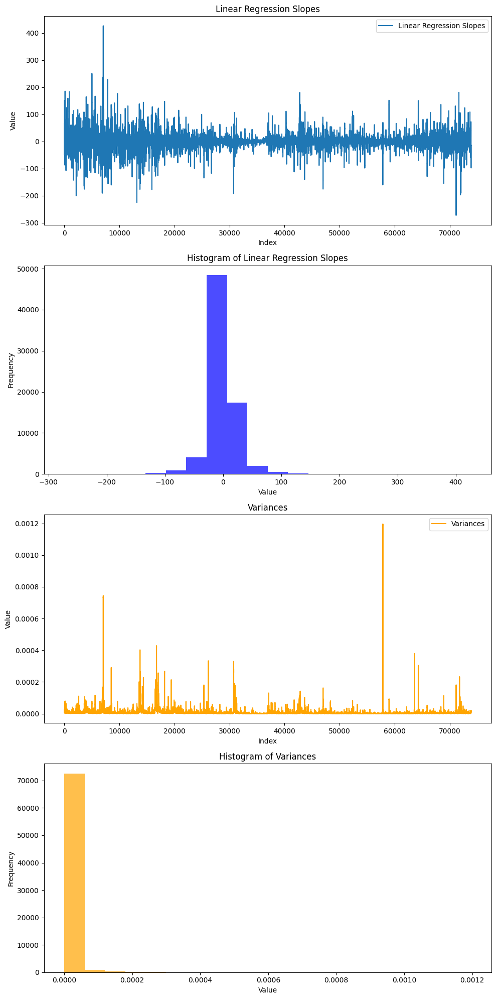

In [9]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(4, 1, figsize=(10, 20))

axs[0].step(range(len(ling_regs)), ling_regs, label='Linear Regression Slopes')
axs[0].set_title('Linear Regression Slopes')
axs[0].set_xlabel('Index')
axs[0].set_ylabel('Value')
axs[0].legend()

axs[1].hist(ling_regs, bins=20, color='blue', alpha=0.7)
axs[1].set_title('Histogram of Linear Regression Slopes')
axs[1].set_xlabel('Value')
axs[1].set_ylabel('Frequency')

axs[2].step(range(len(variances)), variances, label='Variances', color='orange')
axs[2].set_title('Variances')
axs[2].set_xlabel('Index')
axs[2].set_ylabel('Value')
axs[2].legend()

axs[3].hist(variances, bins=20, color='orange', alpha=0.7)
axs[3].set_title('Histogram of Variances')
axs[3].set_xlabel('Value')
axs[3].set_ylabel('Frequency')


ling_regs_variances_corr = np.corrcoef(ling_regs, variances)[0, 1]
plt.tight_layout()

plt.show()


### Optimize parameters
- optimize parameters using model based approach (uses radnom forest underhood)
- many parameters are here so its better then randomized search
- est. time is about 1 - 2 hours
- from optimization part we will plot also the heatmap for parameters to see what values were affecting how much the result

Trying new one strategy with new params: tics_for_lin_reg: 45, tics_for_variance: 32, level_multi: 8, variance_percentile_num: 20, take_profit: 0.02731301113894728, stop_loss: 0.03954266682704942, pos_min_slope: 0.4919621202245335, pos_max_slope: 0.7380426331770067
Trying new one strategy with new params: tics_for_lin_reg: 8, tics_for_variance: 98, level_multi: 9, variance_percentile_num: 12, take_profit: 0.03451908018094806, stop_loss: 0.0493685685887575, pos_min_slope: 0.4742335086128262, pos_max_slope: 0.7428095534488253
Trying new one strategy with new params: tics_for_lin_reg: 43, tics_for_variance: 63, level_multi: 5, variance_percentile_num: 18, take_profit: 0.03711875784625035, stop_loss: 0.03795359327421062, pos_min_slope: 0.4971531109040651, pos_max_slope: 0.7996952495013179
Trying new one strategy with new params: tics_for_lin_reg: 24, tics_for_variance: 56, level_multi: 8, variance_percentile_num: 12, take_profit: 0.026024908342289897, stop_loss: 0.046543756033999115, pos_m

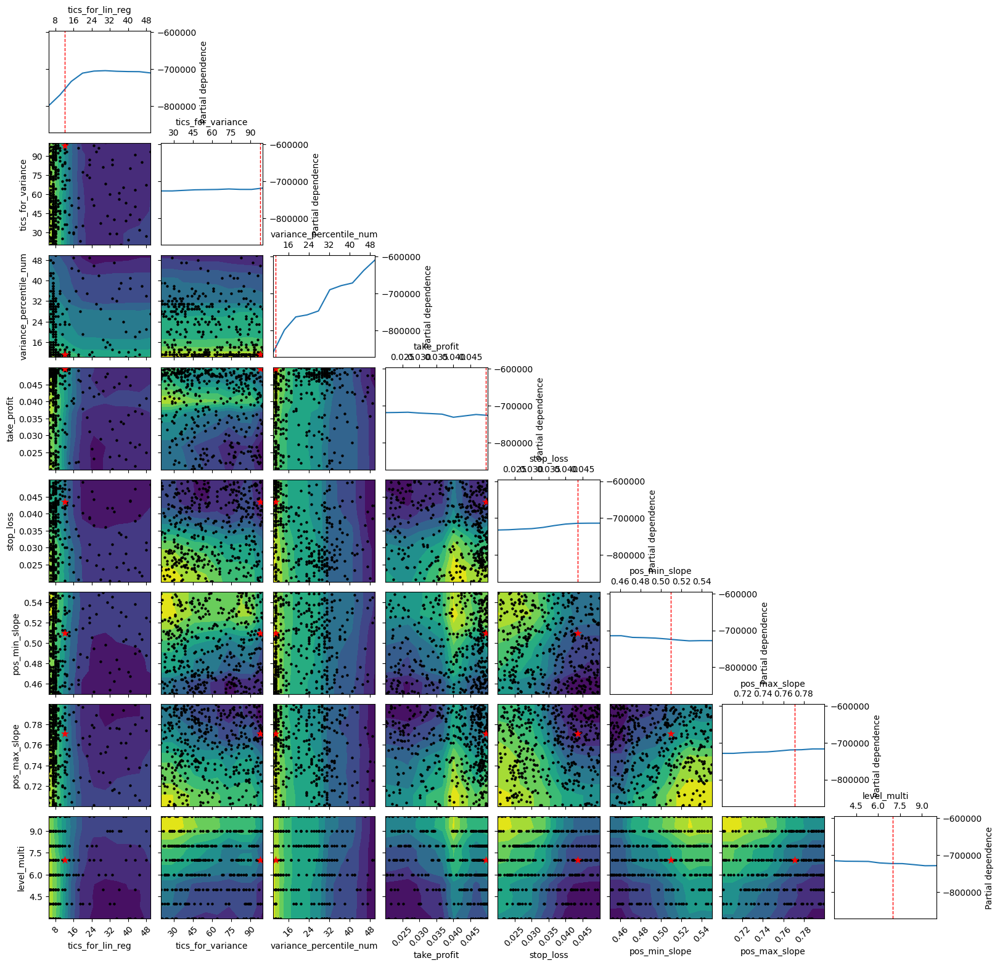

In [5]:
trend_folllower_train = algos['trend_follower']
stats_skopt, heatmap, optimize_result = trend_folllower_train.optimize(
    tics_for_lin_reg=[5, 10, 20, 50],
    tics_for_variance=[20, 100,50],
    variance_percentile_num=[10, 20, 30, 40,50],
    take_profit=[0.02, 0.03, 0.04, 0.05],
    stop_loss=[0.02, 0.03, 0.04, 0.05],
    pos_min_slope=[0.45, 0.5, 0.55],
    pos_max_slope=[0.7, 0.75, 0.8],
    level_multi=[3,5,10],
    maximize='Equity Final [$]',
    method='skopt',
    max_tries=400,
    random_state=0,
    return_optimization=True,
    return_heatmap=True,
)
print(heatmap.sort_values().iloc[-3:])
print(stats_skopt)
from skopt.plots import plot_objective
_ = plot_objective(optimize_result, n_points=10)



- let's see the result on testing set
- you can check it also at: https://trend-follower.netlify.app

In [6]:
trend_follower_test = Backtest(test_btc_data, TrendFollower, cash=1_000_000, commission=.002)
result = trend_follower_test.run()
print(result)
trend_follower_test.plot(resample=False, plot_volume=True, plot_drawdown=True)

Trying new one strategy with new params: tics_for_lin_reg: 12, tics_for_variance: 98, level_multi: 7, variance_percentile_num: 11, take_profit: 0.049582, stop_loss: 0.043477, pos_min_slope: 0.509725, pos_max_slope: 0.771271
Start                     2022-10-31 12:00:00
End                       2024-01-31 23:45:00
Duration                    457 days 11:45:00
Exposure Time [%]                   44.968124
Equity Final [$]               1088735.875115
Equity Peak [$]                1144534.431892
Return [%]                           8.873588
Buy & Hold Return [%]              106.003359
Return (Ann.) [%]                    7.010197
Volatility (Ann.) [%]               17.833645
Sharpe Ratio                         0.393088
Sortino Ratio                        0.660833
Calmar Ratio                         0.509011
Max. Drawdown [%]                  -13.772184
Avg. Drawdown [%]                   -0.909653
Max. Drawdown Duration      147 days 20:30:00
Avg. Drawdown Duration        6 days 04:

/opt/homebrew/lib/python3.11/site-packages/backtesting/_plotting.py:456: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  .resample(resample_rule, label='left')


Row(id='1498', ...)

## Monte Carlo results
- first load some paths from monte carlo simulations
- apply for them our strategy 300 times
- gather results into cache variables

In [5]:
equity_cache = []
drawdown_cache = []

for i in range(1, 300):
    file_path = './data/15mBtcMonteCarlo/MonteCarloBtc' + str(i) + '.csv'
    print('Working on: ', file_path)
    monte_carlo_i = pd.read_csv(file_path)
    monte_carlo_i['open_time'] = pd.to_datetime(monte_carlo_i['open_time'])
    monte_carlo_i['Open'] = monte_carlo_i['High'] = monte_carlo_i['Low'] = monte_carlo_i['Close']
    monte_carlo_i.set_index('open_time', inplace=True)
    trend_follower_test = Backtest(monte_carlo_i, RevertIt, cash=1_000_000, commission=.002)
    result = trend_follower_test.run()
    drawdown = result._equity_curve['DrawdownPct']
    equity = result._equity_curve['Equity']
    equity_cache.append(equity)
    drawdown_cache.append(drawdown)
    if i < 3:
        print(result)
        trend_follower_test.plot(resample=False, plot_volume=True, plot_drawdown=True)
    print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())



Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc1.csv
Trying new one strategy with new params: tics_for_lin_reg: 12, tics_for_variance: 98, level_multi: 7, variance_percentile_num: 11, take_profit: 0.049582, stop_loss: 0.043477, pos_min_slope: 0.509725, pos_max_slope: 0.771271
Start                     1970-01-01 00:00:00
End                       1970-01-01 00:00...
Duration                  0 days 00:00:00....
Exposure Time [%]                   43.416667
Equity Final [$]                823997.411621
Equity Peak [$]                1033807.887131
Return [%]                         -17.600259
Buy & Hold Return [%]              -21.315016
Return (Ann.) [%]                         0.0
Volatility (Ann.) [%]                     NaN
Sharpe Ratio                              NaN
Sortino Ratio                             NaN
Calmar Ratio                              0.0
Max. Drawdown [%]                  -22.937227
Avg. Drawdown [%]                   -1.129344
Max. Drawdown Duration    0 da

/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_36907/3235686839.py:19: UserWarning: 'Can't superimpose OHLC data with rule 'None'(index datetime resolution: 'nanosecond'). Skipping.
  trend_follower_test.plot(resample=False, plot_volume=True, plot_drawdown=True)
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_36907/3235686839.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  823997.4116209075  and max drawdown:  0.22937227099669233
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc2.csv
Trying new one strategy with new params: tics_for_lin_reg: 12, tics_for_variance: 98, level_multi: 7, variance_percentile_num: 11, take_profit: 0.049582, stop_loss: 0.043477, pos_min_slope: 0.509725, pos_max_slope: 0.771271


KeyboardInterrupt: 

- Now for each cached equity get the last one and for them plot a bloxbot
- same goes for max drawdown

In [113]:
equity_cache_np = np.array(equity_cache)
drawdown_cache_np = np.array(drawdown_cache)
equity_last_elements = [arr[-1] for arr in equity_cache]

equity_last_elements_np = np.array(equity_last_elements)

drawdown_max_values = [np.max(arr) for arr in drawdown_cache]

drawdown_max_values_np = np.array(drawdown_max_values)


data = {"Equity_Last_Element": equity_last_elements, "Max_Drawdown": drawdown_max_values}
df = pd.DataFrame(data)
df.to_csv("./data/fromSrc/corr_friends_on_monte_carlo.csv", index=False)



print('Equity last elements mean: ', equity_last_elements_np.mean())
print('Equity last elements median: ', np.median(equity_last_elements_np))
print('Drawdown max values mean: ', drawdown_max_values_np.mean())
print('Drawdown max values median: ', np.median(drawdown_max_values_np))



Equity last elements mean:  1026573.5485904998
Equity last elements median:  1013779.8764863362
Drawdown max values mean:  0.1858686153515913
Drawdown max values median:  0.17149628247964377


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_23477/4000857776.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equity_last_elements = [arr[-1] for arr in equity_cache]


# Revert It
- revert the price to recent means value


- First find optimals params from training set

In [3]:
roll = [1, 20, 50 ,100, 200, 500, 1000]
prob_roll = [10, 20, 50, 100, 200, 300]
critical_prob = [0.25, 0.3, 0.5, 0.6, 0.7]
min_std = [10, 100, 200, 300, 400, 600, 800, 1000, 1500, 2000, 2400]
optimize_result = algos['revert_it'].optimize(
            roll=roll,
            prob_roll=prob_roll,
            min_std = min_std,
            # tp=tp,
            # sl=sl,
            critical_prob=critical_prob,
            constraint=lambda param: param.prob_roll < param.roll,
            maximize='Equity Final [$]',
            method='skopt',
            max_tries=750,
            random_state=0,
            return_optimization=True,
            return_heatmap=True,
        )
print(optimize_result)
print(optimize_result._strategy._params)

Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242
Init with self params: roll: 475, prob_roll: 127, critical_prob: 0.4635363047260549, min_std: 979
Init with self params: roll: 338, prob_roll: 73, critical_prob: 0.5516172144348991, min_std: 1105
Init with self params: roll: 988, prob_roll: 111, critical_prob: 0.6041557213500679, min_std: 716
Init with self params: roll: 527, prob_roll: 234, critical_prob: 0.39764335962013075, min_std: 1889
Init with self params: roll: 858, prob_roll: 255, critical_prob: 0.6370800326171182, min_std: 528
Init with self params: roll: 777, prob_roll: 100, critical_prob: 0.5602537996905799, min_std: 434
Init with self params: roll: 387, prob_roll: 103, critical_prob: 0.2704813531423536, min_std: 2278
Init with self params: roll: 719, prob_roll: 140, critical_prob: 0.2927029950036857, min_std: 1977
Init with self params: roll: 292, prob_roll: 275, critical_prob: 0.252763285663889, min_std: 1716
Init with self 

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


Init with self params: roll: 325, prob_roll: 213, critical_prob: 0.48027233910813727, min_std: 237
Init with self params: roll: 792, prob_roll: 209, critical_prob: 0.4103807853022666, min_std: 949
Init with self params: roll: 565, prob_roll: 243, critical_prob: 0.5416996995163368, min_std: 1883
Init with self params: roll: 194, prob_roll: 168, critical_prob: 0.676042752295797, min_std: 922
Init with self params: roll: 467, prob_roll: 111, critical_prob: 0.5230424782695446, min_std: 1663
Init with self params: roll: 880, prob_roll: 264, critical_prob: 0.30805345325012445, min_std: 1208
Init with self params: roll: 462, prob_roll: 210, critical_prob: 0.40307018736932126, min_std: 64
Init with self params: roll: 717, prob_roll: 252, critical_prob: 0.3047283138805826, min_std: 1563
Init with self params: roll: 349, prob_roll: 93, critical_prob: 0.6995712594039225, min_std: 1249
Init with self params: roll: 723, prob_roll: 181, critical_prob: 0.6647938226625204, min_std: 1255
Init with self

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


Init with self params: roll: 629, prob_roll: 82, critical_prob: 0.3076866828083172, min_std: 1187
Init with self params: roll: 528, prob_roll: 105, critical_prob: 0.5662318206766652, min_std: 1753
Init with self params: roll: 916, prob_roll: 104, critical_prob: 0.2670866122554899, min_std: 1157
Init with self params: roll: 727, prob_roll: 72, critical_prob: 0.6699288743253707, min_std: 2336
Init with self params: roll: 807, prob_roll: 295, critical_prob: 0.5110113565360086, min_std: 1159
Init with self params: roll: 853, prob_roll: 290, critical_prob: 0.44589056592475784, min_std: 908
Init with self params: roll: 710, prob_roll: 179, critical_prob: 0.40419565596147455, min_std: 2343
Init with self params: roll: 746, prob_roll: 213, critical_prob: 0.6993308769489082, min_std: 1640
Init with self params: roll: 625, prob_roll: 166, critical_prob: 0.6414596563028663, min_std: 1897
Init with self params: roll: 642, prob_roll: 181, critical_prob: 0.5036891182935974, min_std: 483
Init with se

AttributeError: 'tuple' object has no attribute '_strategy'

In [4]:
print((optimize_result[0]))
print((optimize_result[0]._strategy._params))

Start                     2021-12-14 00:00:00
End                       2022-10-31 11:45:00
Duration                    321 days 11:45:00
Exposure Time [%]                       93.51
Equity Final [$]                1400242.46748
Equity Peak [$]                 1477791.19928
Return [%]                          40.024247
Buy & Hold Return [%]              -55.422041
Return (Ann.) [%]                   48.078703
Volatility (Ann.) [%]               49.402756
Sharpe Ratio                         0.973199
Sortino Ratio                        2.340557
Calmar Ratio                         2.222841
Max. Drawdown [%]                  -21.629397
Avg. Drawdown [%]                   -1.332986
Max. Drawdown Duration      134 days 15:30:00
Avg. Drawdown Duration        3 days 21:30:00
# Trades                                  146
Win Rate [%]                        56.164384
Best Trade [%]                      37.282732
Worst Trade [%]                    -21.141584
Avg. Trade [%]                    

- Now we have optimalized parameter which will be used on testing dataset to see how they perform there

In [5]:
algo_test_data = Backtest(test_btc_data, RevertIt, cash = 1_000_000, commission=.002)
rt_test = algo_test_data.run()
print(rt_test)
print(rt_test._strategy._params)
algo_test_data.plot(resample=False, plot_volume=True, plot_drawdown=True)

Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242
Start                     2022-10-31 12:00:00
End                       2024-01-31 23:45:00
Duration                    457 days 11:45:00
Exposure Time [%]                   96.714481
Equity Final [$]                 1375435.9572
Equity Peak [$]                   1529688.053
Return [%]                          37.543596
Buy & Hold Return [%]              106.003359
Return (Ann.) [%]                   28.922619
Volatility (Ann.) [%]               28.856175
Sharpe Ratio                         1.002303
Sortino Ratio                        2.025808
Calmar Ratio                         1.614427
Max. Drawdown [%]                  -17.915103
Avg. Drawdown [%]                   -1.244697
Max. Drawdown Duration      100 days 20:00:00
Avg. Drawdown Duration        4 days 12:02:00
# Trades                                  143
Win Rate [%]                        60.839161
Best Trade [%]             

/opt/homebrew/lib/python3.11/site-packages/backtesting/_plotting.py:456: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  .resample(resample_rule, label='left')


Row(id='1612', ...)

## Monte Carlo results
- first load some paths from monte carlo simulations (same as for Trend Follower)
- apply for them our strategy 300 times 
- gather results into cache variables

In [2]:
equity_cache = []
drawdown_cache = []

for i in range(1, 300):
    file_path = './data/15mBtcMonteCarlo/MonteCarloBtc' + str(i) + '.csv'
    print('Working on: ', file_path)
    monte_carlo_i = pd.read_csv(file_path)
    monte_carlo_i['open_time'] = pd.to_datetime(monte_carlo_i['open_time'])
    monte_carlo_i['Open'] = monte_carlo_i['High'] = monte_carlo_i['Low'] = monte_carlo_i['Close']
    monte_carlo_i.set_index('open_time', inplace=True)
    uno_uno_test = Backtest(monte_carlo_i, RevertIt, cash=1_000_000, commission=.002)
    result = uno_uno_test.run()
    drawdown = result._equity_curve['DrawdownPct']
    equity = result._equity_curve['Equity']
    equity_cache.append(equity)
    drawdown_cache.append(drawdown)
    if i < 3:
        print(result)
        uno_uno_test.plot(resample=False, plot_volume=True, plot_drawdown=True)
    print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())



Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc1.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242
Start                     1970-01-01 00:00:00
End                       1970-01-01 00:00...
Duration                  0 days 00:00:00....
Exposure Time [%]                   96.180556
Equity Final [$]                974670.418987
Equity Peak [$]                1101784.046229
Return [%]                          -2.532958
Buy & Hold Return [%]              -21.315016
Return (Ann.) [%]                         0.0
Volatility (Ann.) [%]                     NaN
Sharpe Ratio                              NaN
Sortino Ratio                             NaN
Calmar Ratio                              0.0
Max. Drawdown [%]                  -17.498241
Avg. Drawdown [%]                   -0.710099
Max. Drawdown Duration    0 days 00:00:00....
Avg. Drawdown Duration    0 days 00:00:00....
# Trades                                  167
Win Rate [%]     

/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:19: UserWarning: 'Can't superimpose OHLC data with rule 'None'(index datetime resolution: 'nanosecond'). Skipping.
  uno_uno_test.plot(resample=False, plot_volume=True, plot_drawdown=True)
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  974670.4189869852  and max drawdown:  0.17498240984504276
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc2.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242
Start                     1970-01-01 00:00:00
End                       1970-01-01 00:00...
Duration                  0 days 00:00:00....
Exposure Time [%]                   96.856944
Equity Final [$]                3220863.42237
Equity Peak [$]                 3299028.74158
Return [%]                         222.086342
Buy & Hold Return [%]              625.831303
Return (Ann.) [%]                         0.0
Volatility (Ann.) [%]                     NaN
Sharpe Ratio                              NaN
Sortino Ratio                             NaN
Calmar Ratio                              0.0
Max. Drawdown [%]                  -13.865239
Avg. Drawdown [%]                   -0.841849
Max. Drawdown Duration    0 days 00:00:00....
Avg. Drawdown Duration    0 days 00:

/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:19: UserWarning: 'Can't superimpose OHLC data with rule 'None'(index datetime resolution: 'nanosecond'). Skipping.
  uno_uno_test.plot(resample=False, plot_volume=True, plot_drawdown=True)
/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  3220863.422369532  and max drawdown:  0.13865238869167995
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc3.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  963302.5683505129  and max drawdown:  0.26617807726317844
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc4.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1510131.4110052108  and max drawdown:  0.26186421767142765
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc5.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1128171.851979307  and max drawdown:  0.20629759378017665
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc6.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  237189.75366639346  and max drawdown:  0.8013510825085525
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc7.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1045434.3559988461  and max drawdown:  0.5040197640741045
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc8.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  855563.9565036056  and max drawdown:  0.3463543025490773
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc9.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1628782.2360446532  and max drawdown:  0.08698550004042038
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc10.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  363922.5966136636  and max drawdown:  0.7310548106372515
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc11.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  2468688.024201262  and max drawdown:  0.6869344741846
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc12.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  770695.5000403589  and max drawdown:  0.5200608282674635
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc13.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  986948.5714083874  and max drawdown:  0.323011198489636
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc14.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  2489363.945679074  and max drawdown:  0.24416112426309777
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc15.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  643378.7561702516  and max drawdown:  0.5711741695301407
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc16.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  997626.1983184259  and max drawdown:  0.17747682761794648
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc17.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  819341.3425460688  and max drawdown:  0.5135218885631594
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc18.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1213325.1677241959  and max drawdown:  0.18147997014235195
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc19.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  772176.702820215  and max drawdown:  0.49952547308455064
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc20.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  996494.9211153329  and max drawdown:  0.021640625568328797
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc21.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1743354.7772138647  and max drawdown:  0.19156050794465285
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc22.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1149697.8914365754  and max drawdown:  0.15305130863234295
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc23.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1632123.6407058716  and max drawdown:  0.3241712644194009
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc24.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  805822.3116306423  and max drawdown:  0.41311911773278487
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc25.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1996129.7680049022  and max drawdown:  0.30035142211582333
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc26.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  693580.7862922362  and max drawdown:  0.4748098680579468
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc27.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  2810277.9964989773  and max drawdown:  0.300981114759336
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc28.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  2709635.5843038177  and max drawdown:  0.30640655570089137
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc29.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  3021559.128018298  and max drawdown:  0.16468554232915456
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc30.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  641035.0586452493  and max drawdown:  0.4842279048415802
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc31.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1115833.493451053  and max drawdown:  0.48041568013686675
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc32.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1103759.8927159095  and max drawdown:  0.22488310359910701
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc33.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  693274.0052596801  and max drawdown:  0.5451550488108322
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc34.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  2374529.770224838  and max drawdown:  0.2422314015385837
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc35.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1259243.1075555105  and max drawdown:  0.37739103627382076
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc36.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  6425349.637193317  and max drawdown:  0.24595990067106144
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc37.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  323417.44593845826  and max drawdown:  0.7519646964031859
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc38.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1025984.3079569103  and max drawdown:  0.2870433473018087
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc39.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  472857.62930616963  and max drawdown:  0.6598015107376307
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc40.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  739598.3254859337  and max drawdown:  0.6359707406607052
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc41.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1009955.0928305772  and max drawdown:  0.034170425041608166
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc42.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  868202.1489545895  and max drawdown:  0.48225454900683973
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc43.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1405172.3505852257  and max drawdown:  0.2850254349115754
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc44.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  903230.1376044073  and max drawdown:  0.2464130519439245
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc45.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1468513.662132344  and max drawdown:  0.46355507901553594
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc46.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  125513.60471059603  and max drawdown:  0.891479873775325
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc47.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  3107981.7921557445  and max drawdown:  0.2329613748417152
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc48.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1569121.9841740453  and max drawdown:  0.1606856607410071
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc49.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  639625.9088943175  and max drawdown:  0.4626769371917402
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc50.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  128282.1530270065  and max drawdown:  0.9345656934711931
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc51.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  2305934.191416489  and max drawdown:  0.2871724102708316
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc52.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  923133.160295577  and max drawdown:  0.3092608729446842
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc53.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1725044.626552063  and max drawdown:  0.34427070469540044
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc54.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1707475.6744900688  and max drawdown:  0.39312373131497946
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc55.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1827136.6989022857  and max drawdown:  0.22185196721540246
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc56.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1276228.5592665954  and max drawdown:  0.32637371387003633
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc57.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  873368.9982980437  and max drawdown:  0.2202701374016579
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc58.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1084240.2923830636  and max drawdown:  0.33836490339058045
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc59.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  598885.1736802185  and max drawdown:  0.5124173193197439
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc60.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  318714.8202547162  and max drawdown:  0.6902735314881483
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc61.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1215446.2898253452  and max drawdown:  0.17591449172800533
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc62.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  609586.3077735786  and max drawdown:  0.5749492976839741
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc63.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  383745.343845974  and max drawdown:  0.6961611871636941
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc64.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1292909.0947169878  and max drawdown:  0.11114902842227847
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc65.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1407180.0297623565  and max drawdown:  0.18549486338799792
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc66.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  880186.3209525094  and max drawdown:  0.2754817267020877
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc67.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1294179.855420927  and max drawdown:  0.1728224892494752
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc68.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  996977.5001833426  and max drawdown:  0.3716952799508415
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc69.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  925085.3131551871  and max drawdown:  0.2406265446658451
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc70.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  932254.6690974921  and max drawdown:  0.18383062594256627
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc71.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  610646.9609435851  and max drawdown:  0.5768438163335172
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc72.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1248467.9065784437  and max drawdown:  0.3749734589122672
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc73.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  724035.2310442678  and max drawdown:  0.5646644006010662
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc74.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1526314.2733899306  and max drawdown:  0.44475297179479445
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc75.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1043942.1531669656  and max drawdown:  0.2614014220406645
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc76.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1124891.1098925069  and max drawdown:  0.12252715966540706
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc77.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  322812.5195944538  and max drawdown:  0.6970040489924677
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc78.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  367472.09348379035  and max drawdown:  0.7438888706040019
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc79.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  752939.7225881735  and max drawdown:  0.3542438826530555
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc80.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1187509.46595104  and max drawdown:  0.13862559137144526
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc81.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  270687.82684274897  and max drawdown:  0.7626233816324712
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc82.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  856929.8153845228  and max drawdown:  0.2832330208313033
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc83.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  745433.845693856  and max drawdown:  0.6072767860366668
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc84.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  453593.28372006916  and max drawdown:  0.6264126659387144
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc85.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1233139.814614904  and max drawdown:  0.3760330814336761
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc86.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1008032.7520662835  and max drawdown:  0.061656739812412154
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc87.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1155861.6615851352  and max drawdown:  0.4194714220734356
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc88.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  646809.655587091  and max drawdown:  0.4637392642319298
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc89.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  164077.11533327293  and max drawdown:  0.8511221294776451
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc90.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  940603.0728637669  and max drawdown:  0.2404999241443605
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc91.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  386712.6462858411  and max drawdown:  0.7669353128616592
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc92.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  866983.7196948989  and max drawdown:  0.2847856861255256
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc93.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  2133622.682834522  and max drawdown:  0.2999150473032973
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc94.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  468064.42449080653  and max drawdown:  0.6994245156787213
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc95.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1468991.6388409885  and max drawdown:  0.21945881871009765
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc96.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  444107.57223328046  and max drawdown:  0.6848047895852671
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc97.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1021337.7554384521  and max drawdown:  0.33245947530738473
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc98.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1004621.1271021777  and max drawdown:  0.33994537343059417
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc99.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1939857.816887538  and max drawdown:  0.41484725817477897
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc100.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1046490.6470088384  and max drawdown:  0.15308683258653177
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc101.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  166214.5613915722  and max drawdown:  0.8681111919752897
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc102.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1011684.2115942641  and max drawdown:  0.3794831966270369
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc103.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1362936.6267250963  and max drawdown:  0.2982347164902408
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc104.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1074503.2693092052  and max drawdown:  0.26396367233451
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc105.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  694786.3471813359  and max drawdown:  0.5292451919926309
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc106.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  5025009.247785528  and max drawdown:  0.23905039512804382
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc107.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  4917478.772523931  and max drawdown:  0.2867751346020089
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc108.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1665288.0930194638  and max drawdown:  0.24554923177988863
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc109.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  748884.8491267283  and max drawdown:  0.4546714519840067
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc110.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  398263.1781441279  and max drawdown:  0.6873809400038837
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc111.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1146584.8121322142  and max drawdown:  0.3717800046934675
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc112.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  805816.3610680038  and max drawdown:  0.4404247896908732
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc113.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  875011.2516670158  and max drawdown:  0.389251455460944
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc114.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1217445.3615599775  and max drawdown:  0.2905316609733758
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc115.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  834110.9497755448  and max drawdown:  0.4484418561125769
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc116.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  2260927.408999148  and max drawdown:  0.35160262848256296
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc117.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  898556.0511538703  and max drawdown:  0.12696446887983182
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc118.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  632246.9575177196  and max drawdown:  0.7703828844895274
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc119.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1202336.7713703886  and max drawdown:  0.0703307810089655
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc120.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1943137.5041900785  and max drawdown:  0.36485760849681603
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc121.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  2155978.6376487873  and max drawdown:  0.3003836125905599
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc122.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  372669.3285267672  and max drawdown:  0.7227508036893137
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc123.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  484821.9621339861  and max drawdown:  0.6058211036874668
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc124.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  550300.6687330474  and max drawdown:  0.5516865952431858
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc125.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  247025.18388050314  and max drawdown:  0.837143030046275
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc126.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  684267.6552306415  and max drawdown:  0.6096049748955161
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc127.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  523156.6830879563  and max drawdown:  0.6921728924076574
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc128.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1104366.1917343577  and max drawdown:  0.15075684297349046
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc129.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1358562.5522645658  and max drawdown:  0.07386959042624586
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc130.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  715149.5482740824  and max drawdown:  0.4814025564365042
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc131.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  2219732.3131684014  and max drawdown:  0.3098136841888296
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc132.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1148147.149616671  and max drawdown:  0.05552349934157219
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc133.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  2612927.573191557  and max drawdown:  0.3466330347415185
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc134.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1150492.068797147  and max drawdown:  0.1722429037296671
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc135.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  838413.2006325885  and max drawdown:  0.49014172547104373
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc136.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1374758.4067976547  and max drawdown:  0.37775604567384213
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc137.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  873574.7745002967  and max drawdown:  0.37952253023985083
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc138.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1122880.8919745733  and max drawdown:  0.39691469743716945
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc139.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  558528.6204129057  and max drawdown:  0.5722520154120971
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc140.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1047618.5323265734  and max drawdown:  0.1311387854869862
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc141.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  173410.71501393587  and max drawdown:  0.865616579209584
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc142.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  4605735.195584059  and max drawdown:  0.30841825754844876
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc143.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1180169.8084185184  and max drawdown:  0.32570072033815667
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc144.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  647260.3704297949  and max drawdown:  0.39744848337055483
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc145.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  986907.0355140306  and max drawdown:  0.5843786466164986
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc146.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  2094702.787965977  and max drawdown:  0.30992268435344683
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc147.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  746870.8848723092  and max drawdown:  0.38530473263752885
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc148.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  506132.30009772745  and max drawdown:  0.6954751936295553
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc149.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1773780.484233405  and max drawdown:  0.5977471267097985
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc150.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  782370.7210402281  and max drawdown:  0.299744774928683
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc151.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  609853.4589822002  and max drawdown:  0.6401412867221531
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc152.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  817999.4325659935  and max drawdown:  0.39474582010538106
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc153.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  675203.011529272  and max drawdown:  0.40079757137497196
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc154.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1056539.0310550714  and max drawdown:  0.37673328337112566
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc155.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  814423.6670828998  and max drawdown:  0.462044972173017
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc156.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  868177.3318435869  and max drawdown:  0.6209518119264104
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc157.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  707164.3178338436  and max drawdown:  0.36733695085778195
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc158.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  741509.0974728754  and max drawdown:  0.5227723592013752
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc159.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  936657.2075989336  and max drawdown:  0.3177320314204225
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc160.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1534689.132900964  and max drawdown:  0.37006086962218154
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc161.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  873460.2747401679  and max drawdown:  0.2014616351795535
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc162.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  951429.970640792  and max drawdown:  0.48000432992231734
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc163.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  334265.7122517364  and max drawdown:  0.829809221441266
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc164.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  920931.5797889392  and max drawdown:  0.1399116607521559
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc165.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  831169.542612589  and max drawdown:  0.2353846052512143
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc166.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  796617.2654177491  and max drawdown:  0.48077499178049243
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc167.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  590971.933682087  and max drawdown:  0.7141564870444626
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc168.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1234969.7089742548  and max drawdown:  0.2654446766799935
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc169.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  981069.1856805949  and max drawdown:  0.49871552409217723
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc170.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  974564.7866328679  and max drawdown:  0.1780013813275324
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc171.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  98728.66243753837  and max drawdown:  0.920237584755776
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc172.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1664556.1708463668  and max drawdown:  0.08995888833353072
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc173.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  708767.9441141727  and max drawdown:  0.3834072515426855
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc174.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  972035.8612069028  and max drawdown:  0.4503049742310863
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc175.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  917504.1963721438  and max drawdown:  0.2991766047003057
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc176.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  917520.774235846  and max drawdown:  0.28428008825270235
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc177.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1340818.3830810508  and max drawdown:  0.3012870718699653
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc178.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  862483.5619230889  and max drawdown:  0.2688342564730929
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc179.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1038366.1256855122  and max drawdown:  0.07084950315783989
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc180.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  498927.60483418085  and max drawdown:  0.5616069328940863
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc181.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  238388.83388185973  and max drawdown:  0.7915366306684453
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc182.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  829507.0465574582  and max drawdown:  0.45616102917521506
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc183.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1236733.0359282796  and max drawdown:  0.1128829522317214
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc184.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  335721.5977287011  and max drawdown:  0.7798785246705067
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc185.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  577005.1251833595  and max drawdown:  0.6681521614126824
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc186.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  2327114.9212144343  and max drawdown:  0.26880645730676644
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc187.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1003298.810600712  and max drawdown:  0.38728594768426694
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc188.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1322273.8052102886  and max drawdown:  0.49189984252902563
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc189.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1101383.5143110913  and max drawdown:  0.1733007305116181
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc190.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  501673.9148524978  and max drawdown:  0.6604970288069539
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc191.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1228083.0275379522  and max drawdown:  0.34295218599719557
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc192.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  654866.6441171531  and max drawdown:  0.411291595285328
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc193.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1128053.1601869098  and max drawdown:  0.0938046802191832
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc194.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  330142.6908175873  and max drawdown:  0.7849260731916031
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc195.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  872402.4991466495  and max drawdown:  0.5362784351979111
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc196.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1195101.3688878324  and max drawdown:  0.19457683709982854
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc197.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1795639.7192091157  and max drawdown:  0.28238343338549554
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc198.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  757296.2190376372  and max drawdown:  0.4526999158443047
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc199.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  200041.4964669951  and max drawdown:  0.8273128936083679
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc200.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  771956.2141576806  and max drawdown:  0.49162971955934565
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc201.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  334706.4611961626  and max drawdown:  0.6961472863927683
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc202.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  991536.6067522028  and max drawdown:  0.06838946268996904
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc203.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1245567.7323637044  and max drawdown:  0.2364276054570753
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc204.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1207539.2641092048  and max drawdown:  0.39447361331514463
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc205.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  288746.2411892977  and max drawdown:  0.7317142243101522
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc206.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  771739.5043345912  and max drawdown:  0.40953771541452166
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc207.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  478250.1659841662  and max drawdown:  0.7313718965674124
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc208.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  639921.2219914886  and max drawdown:  0.5185085564158756
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc209.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  2514259.0794029934  and max drawdown:  0.3766507835219268
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc210.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  394002.5974094964  and max drawdown:  0.7604514472869884
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc211.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  976605.2625114797  and max drawdown:  0.3859047180777394
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc212.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  849164.513806557  and max drawdown:  0.5464900467509107
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc213.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1219530.6072743821  and max drawdown:  0.5020251054303277
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc214.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1696765.2670240765  and max drawdown:  0.3268968327607419
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc215.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1267114.1394204365  and max drawdown:  0.32180574529297856
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc216.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1576626.2920412237  and max drawdown:  0.3666133929197438
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc217.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  446911.25642288977  and max drawdown:  0.6191330680678161
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc218.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1240691.8823859603  and max drawdown:  0.27801617620112873
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc219.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  779852.4597102083  and max drawdown:  0.540972572600203
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc220.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1068079.3923376105  and max drawdown:  0.11696960636013154
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc221.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  434191.33732048434  and max drawdown:  0.71985623680462
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc222.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1155057.8387137349  and max drawdown:  0.30089625144907095
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc223.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  895149.7899766986  and max drawdown:  0.162699719689528
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc224.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1127397.399911521  and max drawdown:  0.0644639643355166
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc225.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1188168.6803011084  and max drawdown:  0.16320798446677587
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc226.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1138207.1866780522  and max drawdown:  0.43739612016579144
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc227.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1229508.1714853481  and max drawdown:  0.2726695163331251
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc228.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1069486.4511826816  and max drawdown:  0.10520928284061959
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc229.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  602705.7263789708  and max drawdown:  0.5813897564257029
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc230.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1066930.7688732985  and max drawdown:  0.06295445796493249
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc231.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1470765.5018264104  and max drawdown:  0.2896489251666343
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc232.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  756062.7168126045  and max drawdown:  0.40281302786506723
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc233.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1019399.4091579993  and max drawdown:  0.22721086159646575
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc234.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  232817.8000657672  and max drawdown:  0.7978478543866218
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc235.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1017886.3262702726  and max drawdown:  0.330722014529365
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc236.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  256028.6341931545  and max drawdown:  0.809913166476777
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc237.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  2202848.657925932  and max drawdown:  0.18066431469449162
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc238.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  405862.29134714144  and max drawdown:  0.6345557962795177
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc239.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1255299.4749550775  and max drawdown:  0.1298663907666293
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc240.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1015715.4108949612  and max drawdown:  0.3205864227400157
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc241.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1205811.3611915873  and max drawdown:  0.20441219706901215
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc242.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1093760.2846347878  and max drawdown:  0.10334049369219367
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc243.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1450421.4805271123  and max drawdown:  0.28342647142747035
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc244.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1938520.9470169307  and max drawdown:  0.304475413746804
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc245.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  654117.3493873808  and max drawdown:  0.464933421976904
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc246.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1196455.8941879612  and max drawdown:  0.23661721062131047
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc247.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1001377.1779088305  and max drawdown:  0.5111632984060843
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc248.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  584294.013588955  and max drawdown:  0.5408899779370335
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc249.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  955413.9860445225  and max drawdown:  0.4323020958080367
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc250.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1287782.0324887796  and max drawdown:  0.330520882725434
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc251.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1355578.199786311  and max drawdown:  0.3549142101822247
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc252.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  155844.29402684324  and max drawdown:  0.8673463787677098
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc253.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1087897.6171128647  and max drawdown:  0.3759298391368844
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc254.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  457608.08040093177  and max drawdown:  0.6449016521642874
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc255.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  745629.6085108774  and max drawdown:  0.29890021517681864
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc256.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  3384469.268863091  and max drawdown:  0.22919834781826942
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc257.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  3880160.363759339  and max drawdown:  0.38853076817036625
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc258.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  635016.3100950941  and max drawdown:  0.7726366697199712
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc259.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  3692599.3737997464  and max drawdown:  0.4299224139597424
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc260.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1519761.1585691762  and max drawdown:  0.22257858698618216
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc261.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  727431.3424496639  and max drawdown:  0.3369109347191267
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc262.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  2046113.0033317888  and max drawdown:  0.33081017944574354
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc263.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  683435.439153008  and max drawdown:  0.37513970798766516
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc264.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  288884.0326304977  and max drawdown:  0.7574288770567617
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc265.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  558533.1314133408  and max drawdown:  0.6173766375067161
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc266.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1251770.2820417217  and max drawdown:  0.09395872830245322
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc267.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  445640.8086759846  and max drawdown:  0.7321866997883081
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc268.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  967257.3887837008  and max drawdown:  0.3056301478081228
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc269.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  2321947.540567143  and max drawdown:  0.2598437558111707
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc270.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  343589.77238470386  and max drawdown:  0.8072851198115594
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc271.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  444907.81287277734  and max drawdown:  0.700380059855609
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc272.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1046419.0326090896  and max drawdown:  0.03465673031831262
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc273.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  207055.79340950827  and max drawdown:  0.8137462402302053
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc274.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  324630.17536321696  and max drawdown:  0.8786242178048476
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc275.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  744614.6602193688  and max drawdown:  0.45810928818525676
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc276.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1488756.1705723829  and max drawdown:  0.2815984766501034
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc277.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1737191.5446527943  and max drawdown:  0.548046084355577
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc278.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  995036.2250448151  and max drawdown:  0.10379635005320631
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc279.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1123002.4394612676  and max drawdown:  0.2754089870391103
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc280.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  605978.8407809499  and max drawdown:  0.5489443168013437
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc281.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1394313.0119766507  and max drawdown:  0.5449571590173312
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc282.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1201971.7513292427  and max drawdown:  0.2971596611751731
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc283.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  4358265.083526394  and max drawdown:  0.3496233257668028
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc284.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  535123.4683727061  and max drawdown:  0.658005708231945
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc285.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1051545.4493514532  and max drawdown:  0.27811123685848016
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc286.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1934549.319101025  and max drawdown:  0.3703671512845641
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc287.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  2338341.6684949175  and max drawdown:  0.2822240234721427
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc288.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  356920.4340343667  and max drawdown:  0.7659874305513414
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc289.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  932446.7860290789  and max drawdown:  0.31104109855179396
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc290.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1058907.2568395617  and max drawdown:  0.1232064625932574
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc291.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  960914.3416146329  and max drawdown:  0.19027374219132465
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc292.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1120913.068763243  and max drawdown:  0.519699795932355
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc293.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1074887.1689677038  and max drawdown:  0.28870074621930575
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc294.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  990491.9633665439  and max drawdown:  0.07341870047579557
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc295.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  935076.3500319803  and max drawdown:  0.48651506961186486
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc296.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  290650.7898003933  and max drawdown:  0.7723577233726707
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc297.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  1119797.4370807963  and max drawdown:  0.3141603172656824
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc298.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


Final equity:  942449.5190281405  and max drawdown:  0.16895381512444896
Working on:  ./data/15mBtcMonteCarlo/MonteCarloBtc299.csv
Init with self params: roll: 402, prob_roll: 273, critical_prob: 0.29001548005003697, min_std: 242
Final equity:  1960090.5674102847  and max drawdown:  0.4955142413940208


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/3593731721.py:20: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  print('Final equity: ', equity[-1],  ' and max drawdown: ',  drawdown.max())


In [3]:
equity_cache_np = np.array(equity_cache)
drawdown_cache_np = np.array(drawdown_cache)
equity_last_elements = [arr[-1] for arr in equity_cache]

equity_last_elements_np = np.array(equity_last_elements)

drawdown_max_values = [np.max(arr) for arr in drawdown_cache]

drawdown_max_values_np = np.array(drawdown_max_values)


data = {"Equity_Last_Element": equity_last_elements, "Max_Drawdown": drawdown_max_values}
df = pd.DataFrame(data)
df.to_csv("./data/fromSrc/corr_friends_on_monte_carlo.csv", index=False)



print('Equity last elements mean: ', equity_last_elements_np.mean())
print('Equity last elements median: ', np.median(equity_last_elements_np))
print('Drawdown max values mean: ', drawdown_max_values_np.mean())
print('Drawdown max values median: ', np.median(drawdown_max_values_np))



Equity last elements mean:  1126123.4144904292
Equity last elements median:  986948.5714083874
Drawdown max values mean:  0.4064298740968862
Drawdown max values median:  0.3716952799508415


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_51922/4000857776.py:3: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  equity_last_elements = [arr[-1] for arr in equity_cache]


# Arbi Check
- just raw run against test data to show its performance
- in case of potential change of short_rate go right to arbi_check.py and change it in given class 

In [2]:
contactt_data = pd.read_csv('./data/arbitrageDataCheck/futures231229.csv', parse_dates=True, infer_datetime_format=True)
contactt_data['spot_price'] = pd.read_csv('./data/arbitrageDataCheck/btcSpot231229.csv')['Close']
print(contactt_data.head())
for index, value in enumerate(contactt_data['open_time']):
    try:
        pd.to_datetime(value, unit='ms')
    except ValueError:
        print(f"Value at index {index} is problematic: {value}")

contactt_data['open_time'] = pd.to_datetime(contactt_data['open_time'], unit='ms')
contactt_data.set_index('open_time', inplace=True)

arbi_check = Backtest(contactt_data, ArbiCheck, cash=1_000_000_000, commission=0)
result = arbi_check.run()
print(result)
arbi_check.plot(resample=False, plot_volume=True, plot_drawdown=True)


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_71424/94595927.py:1: FutureWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  contactt_data = pd.read_csv('./data/arbitrageDataCheck/futures231229.csv', parse_dates=True, infer_datetime_format=True)


       open_time     Open     High      Low    Close  Volume     close_time  \
0  1693526400000  26334.8  26399.7  26325.1  26390.5    1087  1693527299999   
1  1693527300000  26396.7  26432.9  26393.8  26429.8     627  1693528199999   
2  1693528200000  26427.8  26474.3  26420.1  26446.9     950  1693529099999   
3  1693529100000  26442.8  26463.0  26436.3  26454.4     294  1693529999999   
4  1693530000000  26454.5  26461.0  26410.5  26430.9    1499  1693530899999   

   quote_volume  count  taker_buy_volume  taker_buy_quote_volume  ignore  \
0      4.123111     77               480                1.820736       0   
1      2.373779     54               353                1.336634       0   
2      3.592016     56               772                2.919002       0   
3      1.111452     30                92                0.347880       0   
4      5.671927     61               752                2.845839       0   

   spot_price  
0    25981.79  
1    26020.58  
2    26036.35  
3   

/opt/homebrew/lib/python3.11/site-packages/backtesting/_plotting.py:456: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  .resample(resample_rule, label='left')


Row(id='1678', ...)

# KLAM
- bonus algorithm which compares theoretical futurer price ( our formula ) and exchange price 
- makes decision by that compar.


- first optimize best params

In [2]:
date_string = '220930'
contactt_data = pd.read_csv(f'./data/arbitrageDataCheck/futures{date_string}.csv', parse_dates=True, infer_datetime_format=True)
contactt_data['spot_price'] = pd.read_csv(f'./data/arbitrageDataCheck/btcSpot{date_string}.csv')['Close']
contactt_data['theoretical_futures'] = pd.read_csv(f'./data/klam/theoreticalFutures{date_string}.csv')['Close']
print(contactt_data.head())
for index, value in enumerate(contactt_data['open_time']):
    try:
        pd.to_datetime(value, unit='ms')
    except ValueError:
        print(f"Value at index {index} is problematic: {value}")

contactt_data['open_time'] = pd.to_datetime(contactt_data['open_time'], unit='ms')
contactt_data.set_index('open_time', inplace=True)

klam = Backtest(contactt_data, Klam, cash=1_000_000, commission=.002)

sl = [0.01, 0.02, 0.04, 0.07]
tp = [0.01, 0.02, 0.04, 0.07]
min_base_diff = [1, 10, 100, 200, 400, 600, 900]
optimal_size = [0.1, 0.2, 0.5, 1, 2]
optimize_result = klam.optimize(
            optimal_size = optimal_size,
            sl=sl,
            tp=tp,
            min_base_diff=min_base_diff,
            maximize='Equity Final [$]',
            method='skopt',
            max_tries=1500,
            random_state=0,
            return_optimization=True,
            return_heatmap=True,
        )


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_70968/3189918995.py:2: FutureWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  contactt_data = pd.read_csv(f'./data/arbitrageDataCheck/futures{date_string}.csv', parse_dates=True, infer_datetime_format=True)


       open_time     Open     High      Low    Close  Volume     close_time  \
0  1654041600000  32177.1  32275.8  32097.8  32119.8    6037  1654042499999   
1  1654042500000  32171.5  32263.2  32062.9  32207.4   10106  1654043399999   
2  1654043400000  32211.4  32375.4  32177.3  32358.5    4627  1654044299999   
3  1654044300000  32336.2  32369.4  32278.4  32337.7    3848  1654045199999   
4  1654045200000  32327.9  32335.8  32266.2  32318.4    2579  1654046099999   

   quote_volume  count  taker_buy_volume  taker_buy_quote_volume  ignore  \
0     18.771478    276              1783                5.544862       0   
1     31.409706    402              7148               22.217885       0   
2     14.332294    282              2652                8.213641       0   
3     11.908918    201              2171                6.719472       0   
4      7.986549    156              1108                3.432119       0   

   spot_price  theoretical_futures  
0    31763.68         31700.034

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


Intitialized with tp: 0.03153686132272645, sl: 0.020094869762780458, min_base_diff: 102, optimal_size: 0.23406429806237272
Intitialized with tp: 0.021001921536329737, sl: 0.031045103060473825, min_base_diff: 118, optimal_size: 0.15696189253973664
Intitialized with tp: 0.033578131207571374, sl: 0.046499546985899975, min_base_diff: 125, optimal_size: 0.19149390514014836
Intitialized with tp: 0.01931546195190475, sl: 0.06749023092164923, min_base_diff: 197, optimal_size: 0.2356778664773336
Intitialized with tp: 0.035220318175369504, sl: 0.05974897742814233, min_base_diff: 92, optimal_size: 0.17241967335931546
Intitialized with tp: 0.032359852278115796, sl: 0.034518844981900894, min_base_diff: 182, optimal_size: 0.2652898089598953
Intitialized with tp: 0.0334945068813017, sl: 0.055292799659236565, min_base_diff: 1, optimal_size: 0.2367881618146276
 Current real price: 24241.8, current theoretical price: 24255.5964888422, base_diff: 13.796488842199324
 Current real price: 24077.4, current t

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


Intitialized with tp: 0.02385785704952767, sl: 0.06266634809780323, min_base_diff: 52, optimal_size: 0.369451146234002
Intitialized with tp: 0.014586887870562547, sl: 0.06199745059160821, min_base_diff: 67, optimal_size: 0.36726420230321855
Intitialized with tp: 0.024241759197133714, sl: 0.06206509128012016, min_base_diff: 155, optimal_size: 0.39929697214996274
Intitialized with tp: 0.016941591749175398, sl: 0.0658172713706123, min_base_diff: 138, optimal_size: 0.31390473209077274
Intitialized with tp: 0.015107441082100423, sl: 0.06681152994893345, min_base_diff: 119, optimal_size: 0.3225841479454992
Intitialized with tp: 0.051109132396995195, sl: 0.06225228152684738, min_base_diff: 133, optimal_size: 0.3677530678358274
Intitialized with tp: 0.01880568175592144, sl: 0.06919236086634989, min_base_diff: 111, optimal_size: 0.3818362996134024
Intitialized with tp: 0.013095582393933646, sl: 0.06799525318036544, min_base_diff: 148, optimal_size: 0.3079129567314896
Intitialized with tp: 0.012

/opt/homebrew/lib/python3.11/site-packages/backtesting/_stats.py:122: RuntimeWarning: divide by zero encountered in double_scalars
  s.loc['Sortino Ratio'] = np.clip((annualized_return - risk_free_rate) / (np.sqrt(np.mean(day_returns.clip(-np.inf, 0)**2)) * np.sqrt(annual_trading_days)), 0, np.inf)  # noqa: E501


 Current real price: 24241.8, current theoretical price: 24255.5964888422, base_diff: 13.796488842199324
 Current real price: 23377.7, current theoretical price: 23386.8787833911, base_diff: 9.178783391100296
 Current real price: 23314.8, current theoretical price: 23326.4184950062, base_diff: 11.618495006201556
 Current real price: 23315.1, current theoretical price: 23330.3444173494, base_diff: 15.244417349400464
 Current real price: 23334.4, current theoretical price: 23343.7858870152, base_diff: 9.385887015199842
 Current real price: 23395.9, current theoretical price: 23407.3395435259, base_diff: 11.439543525899353
 Current real price: 23466.3, current theoretical price: 23475.3951046106, base_diff: 9.095104610601993
 Current real price: 23500.6, current theoretical price: 23511.3184590032, base_diff: 10.718459003201133
 Current real price: 23251.7, current theoretical price: 23262.2899235128, base_diff: 10.589923512798123
 Current real price: 23327.0, current theoretical price: 2

KeyboardInterrupt: 

- now run it against test data set

In [3]:
date_string = '231229'
contactt_data = pd.read_csv(f'./data/arbitrageDataCheck/futures{date_string}.csv', parse_dates=True, infer_datetime_format=True)
contactt_data['spot_price'] = pd.read_csv(f'./data/arbitrageDataCheck/btcSpot{date_string}.csv')['Close']
contactt_data['theoretical_futures'] = pd.read_csv(f'./data/klam/theoreticalFutures{date_string}.csv')['Close']
print(contactt_data.head())
for index, value in enumerate(contactt_data['open_time']):
    try:
        pd.to_datetime(value, unit='ms')
    except ValueError:
        print(f"Value at index {index} is problematic: {value}")

contactt_data['open_time'] = pd.to_datetime(contactt_data['open_time'], unit='ms')
contactt_data.set_index('open_time', inplace=True)

klam = Backtest(contactt_data, Klam, cash=1_000_000, commission=.002)
klam.run()
klam.plot(resample=False, plot_volume=True, plot_drawdown=True)


/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_60430/2759497525.py:2: FutureWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  contactt_data = pd.read_csv(f'./data/arbitrageDataCheck/futures{date_string}.csv', parse_dates=True, infer_datetime_format=True)


       open_time     Open     High      Low    Close  Volume     close_time  \
0  1693526400000  26334.8  26399.7  26325.1  26390.5    1087  1693527299999   
1  1693527300000  26396.7  26432.9  26393.8  26429.8     627  1693528199999   
2  1693528200000  26427.8  26474.3  26420.1  26446.9     950  1693529099999   
3  1693529100000  26442.8  26463.0  26436.3  26454.4     294  1693529999999   
4  1693530000000  26454.5  26461.0  26410.5  26430.9    1499  1693530899999   

   quote_volume  count  taker_buy_volume  taker_buy_quote_volume  ignore  \
0      4.123111     77               480                1.820736       0   
1      2.373779     54               353                1.336634       0   
2      3.592016     56               772                2.919002       0   
3      1.111452     30                92                0.347880       0   
4      5.671927     61               752                2.845839       0   

   spot_price  theoretical_futures  
0    25981.79         26774.079

/opt/homebrew/lib/python3.11/site-packages/backtesting/_plotting.py:456: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  .resample(resample_rule, label='left')


Row(id='2669', ...)

- and for another time futures contract where r(t) is negative, bearish mode for futures price

In [4]:
date_string = '220325'
contactt_data = pd.read_csv(f'./data/arbitrageDataCheck/futures{date_string}.csv', parse_dates=True, infer_datetime_format=True)
contactt_data['spot_price'] = pd.read_csv(f'./data/arbitrageDataCheck/btcSpot{date_string}.csv')['Close']
contactt_data['theoretical_futures'] = pd.read_csv(f'./data/klam/theoreticalFutures{date_string}.csv')['Close']
print(contactt_data.head())
for index, value in enumerate(contactt_data['open_time']):
    try:
        pd.to_datetime(value, unit='ms')
    except ValueError:
        print(f"Value at index {index} is problematic: {value}")

contactt_data['open_time'] = pd.to_datetime(contactt_data['open_time'], unit='ms')
contactt_data.set_index('open_time', inplace=True)

klam = Backtest(contactt_data, Klam, cash=1_000_000, commission=.002)
print(klam.run())
klam.plot(resample=False, plot_volume=True, plot_drawdown=True)

/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_60430/1316365734.py:2: FutureWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  contactt_data = pd.read_csv(f'./data/arbitrageDataCheck/futures{date_string}.csv', parse_dates=True, infer_datetime_format=True)


       open_time     Open     High      Low    Close  Volume     Close_time  \
0  1640995200000  47035.1  47357.1  47030.3  47164.0   55643  1640996099999   
1  1640996100000  47155.5  47244.5  47072.7  47196.9   24094  1640996999999   
2  1640997000000  47205.1  47541.9  47193.9  47478.0   49723  1640997899999   
3  1640997900000  47477.8  47599.3  47443.9  47507.7   35249  1640998799999   
4  1640998800000  47507.8  47622.6  47426.1  47616.1   30519  1640999699999   

   quote_volume  count  taker_buy_volume  taker_buy_quote_volume  ignore  \
0    117.977280   1627             27384               58.071777       0   
1     51.080428    674             11318               23.999737       0   
2    104.884699   1274             31264               65.945464       0   
3     74.138515   1054             17724               37.279606       0   
4     64.237283    847             14602               30.725868       0   

   spot_price  theoretical_futures  
0    46332.51         46240.850

/opt/homebrew/lib/python3.11/site-packages/backtesting/_plotting.py:456: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  .resample(resample_rule, label='left')


Row(id='3863', ...)

- and againg for another futures contract this one has positive r(t) although price is in bearish model

In [2]:
date_string = '221230'
contactt_data = pd.read_csv(f'./data/arbitrageDataCheck/futures{date_string}.csv', parse_dates=True, infer_datetime_format=True)
contactt_data['spot_price'] = pd.read_csv(f'./data/arbitrageDataCheck/btcSpot{date_string}.csv')['Close']
contactt_data['theoretical_futures'] = pd.read_csv(f'./data/klam/theoreticalFutures{date_string}.csv')['Close']
print(contactt_data.head())
for index, value in enumerate(contactt_data['open_time']):
    try:
        pd.to_datetime(value, unit='ms')
    except ValueError:
        print(f"Value at index {index} is problematic: {value}")

contactt_data['open_time'] = pd.to_datetime(contactt_data['open_time'], unit='ms')
contactt_data.set_index('open_time', inplace=True)

klam = Backtest(contactt_data, Klam, cash=1_000_000, commission=.002)
print(klam.run())
klam.plot(resample=False, plot_volume=True, plot_drawdown=True)

/var/folders/w6/66z9wqln7sx1zgx4d3v00v5h0000gn/T/ipykernel_71329/3205596263.py:2: FutureWarning: The argument 'infer_datetime_format' is deprecated and will be removed in a future version. A strict version of it is now the default, see https://pandas.pydata.org/pdeps/0004-consistent-to-datetime-parsing.html. You can safely remove this argument.
  contactt_data = pd.read_csv(f'./data/arbitrageDataCheck/futures{date_string}.csv', parse_dates=True, infer_datetime_format=True)


       open_time     Open     High      Low    Close  Volume     Close_time  \
0  1664582400000  19497.4  19533.4  19485.4  19529.7   10482  1664583299999   
1  1664583300000  19529.7  19556.5  19511.7  19527.5    3068  1664584199999   
2  1664584200000  19527.6  19527.6  19430.1  19432.4   20385  1664585099999   
3  1664585100000  19432.5  19472.3  19430.1  19472.3    5721  1664585999999   
4  1664586000000  19473.0  19475.5  19450.0  19463.5    8846  1664586899999   

   quote_volume  count  taker_buy_volume  taker_buy_quote_volume  ignore  \
0     53.732494    416              7342               37.638779       0   
1     15.702822    153              2010               10.288363       0   
2    104.720656    590              8309               42.696605       0   
3     29.409947    183              4389               22.563765       0   
4     45.447588    295              2650               13.615508       0   

   spot_price  theoretical_futures  
0    19459.44         19595.782

/opt/homebrew/lib/python3.11/site-packages/backtesting/_plotting.py:456: FutureWarning: 'H' is deprecated and will be removed in a future version, please use 'h' instead.
  .resample(resample_rule, label='left')


Row(id='1477', ...)